### Spring AA Manuscript Figures

This notebook contains clean code for all trend figures for the manuscript.

In [1]:
import xarray as xr
import numpy as np
import glob
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as colors
import matplotlib.patches as mpatches
from cartopy.util import add_cyclic_point
from matplotlib.pyplot import cm
from scipy.stats import norm
from scipy import stats
import matplotlib.colors as mcolors
import warnings
warnings.filterwarnings("ignore")

In [2]:
def spatial_average(array, lats):
    weights = np.cos(np.deg2rad(lats))
    if len(array.shape) == 2:
        weights_array = weights[:, np.newaxis]
        weighted_array = np.multiply(array, weights_array)
        shape = np.shape(weighted_array)
        weighted_reshaped = np.reshape(weighted_array, (shape[0]*shape[1]))
        weighted_sum = np.nansum(weighted_reshaped, axis=0)
    if len(array.shape) == 3:
        weights_array = weights[np.newaxis, :, np.newaxis]
        weighted_array = np.multiply(array, weights_array)
        shape = np.shape(weighted_array)
        weighted_reshaped = np.reshape(weighted_array, (shape[0], shape[1]*shape[2]))
        weighted_sum = np.nansum(weighted_reshaped, axis=1)
    if len(array.shape) == 4:
        weights_array = weights[np.newaxis, np.newaxis, :, np.newaxis]
        weighted_array = np.multiply(array, weights_array)
        shape = np.shape(weighted_array)
        weighted_reshaped = np.reshape(weighted_array, (shape[0], shape[1], shape[2]*shape[3]))
        weighted_sum = np.nansum(weighted_reshaped, axis=2)
    if len(array.shape) == 5:
        weights_array = weights[np.newaxis, np.newaxis, np.newaxis, :, np.newaxis]
        weighted_array = np.multiply(array, weights_array)
        shape = np.shape(weighted_array)
        weighted_reshaped = np.reshape(weighted_array, (shape[0], shape[1], shape[2], shape[3]*shape[4]))
        weighted_sum = np.nansum(weighted_reshaped, axis=3)
    denom = np.nansum(weights) * 144
    return np.divide(weighted_sum, denom)


def compute_radius(ortho, radius_degrees, lat, lon):
    phi1 = lat + radius_degrees if lat <= 0 else lat - radius_degrees
    _, y1 = ortho.transform_point(lon, phi1, ccrs.PlateCarree())
    return abs(y1)


# Spatial plot settings
transform = ccrs.PlateCarree()
projection = ccrs.NorthPolarStereo()

# Define projection used to display the circle
lat_draw = 51.4198101
lon_draw = -0.950854653584
proj = ccrs.Orthographic(central_longitude=lon_draw, central_latitude=lat_draw)

# Compute required radius in projection native coordinates
r_ortho60 = compute_radius(proj, 30, lat_draw, lon_draw)
r_ortho70 = compute_radius(proj, 20, lat_draw, lon_draw)

In [3]:
# Global variables
lats = np.arange(-88.75, 88.751, 2.5)
lons = np.arange(1.25, 358.751, 2.5)

# Plot labels
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# User input
degree = input("Enter the degree (70, 65, or 60):")
cut = {'70': 64, '65': 62, '60': 60}.get(degree, None)

Enter the degree (70, 65, or 60): 70


### Load Data

#### Monthly

In [4]:
# Observations
paths = glob.glob('/pscratch/sd/s/skygale/training-data/monthly/observations/sat/*.nc')

obs_names = []
obs_sat = []
obs_spring_months_maps_sat = []
obs_arctic_monthly_all = []
obs_global_monthly_all = []

for path in reversed(paths):
    obs_name = path.split('/')[9][:-3]
    obs_names.append(obs_name)

    # Open dataset
    ds = xr.open_dataset(path).DATA
    obs_sat.append(ds)
    obs_spring_months_maps_sat.append(ds)

    # Get weighted spatial average
    obs_arctic_monthly = spatial_average(np.array(ds[:, cut:]), lats[cut:])
    obs_global_monthly = spatial_average(np.array(ds), lats)

    # Append for all observations
    obs_arctic_monthly_all.append(obs_arctic_monthly)
    obs_global_monthly_all.append(obs_global_monthly)

# Rerank observations in terms of AA magnitude
obs_reranked = ['NOAAv6',
                'HadCRUTv5',
                'GISTv4',
                'BerkeleyEarth']

# Get new ranked indices
ranked_indices = []
for name in obs_reranked:
    ranked_indices.append(obs_names.index(name))

# Rerank arrays
obs_arctic_monthly_all = [obs_arctic_monthly_all[i] for i in ranked_indices]
obs_global_monthly_all = [obs_global_monthly_all[i] for i in ranked_indices]
obs_names = [obs_names[i] for i in ranked_indices]

obs_arctic_monthly_mean = np.nanmean(obs_arctic_monthly_all)
obs_global_monthly_mean = np.nanmean(obs_global_monthly_all)
obs_aa_monthly = obs_arctic_monthly_mean / obs_global_monthly_mean

print('Arctic Annual Mean:', np.round(obs_arctic_monthly_mean, 3))
print('Global Annual Mean:', np.round(obs_global_monthly_mean, 3))
print('Annual Mean AA:    ', np.round(obs_aa_monthly, 1))

print(np.shape(obs_spring_months_maps_sat))

Arctic Annual Mean: 0.791
Global Annual Mean: 0.189
Annual Mean AA:     4.2
(4, 12, 72, 144)


In [5]:
# Observations
paths = glob.glob('/pscratch/sd/s/skygale/training-data/monthly/observations/slp/*')

obs_slp = []
slp_names = []
obs_spring_months_maps_slp = []
for path in reversed(paths):
    obs_name = path.split('/')[9][:-3]
    slp_names.append(obs_name)
    ds = xr.open_dataset(path).DATA
    obs_slp.append(ds)
    obs_spring_months_maps_slp.append(ds)

print(np.shape(obs_spring_months_maps_slp))

(3, 12, 72, 144)


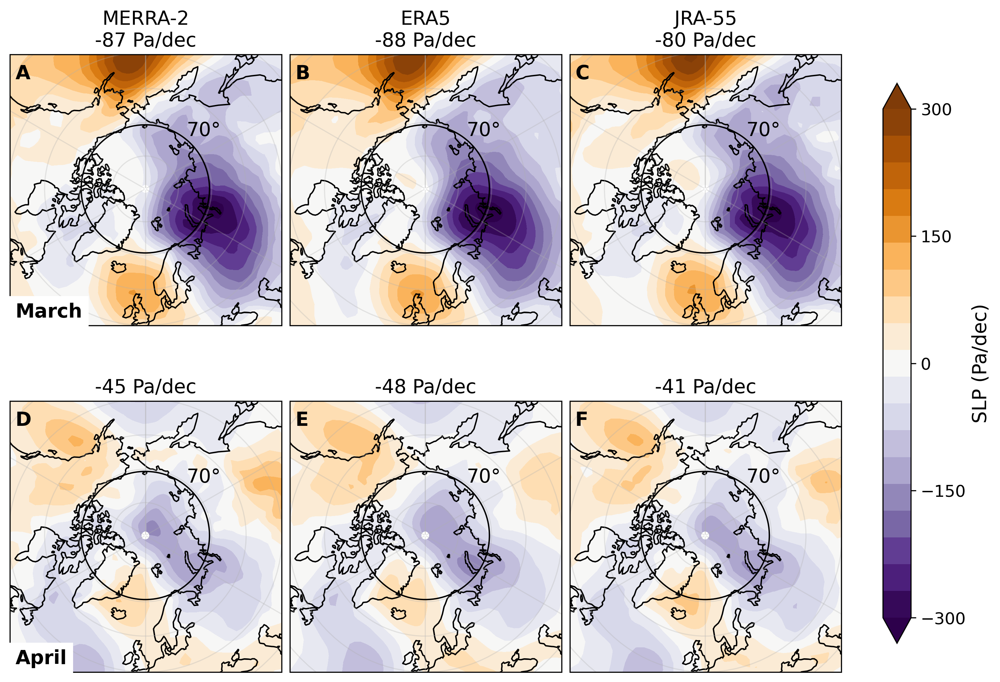

In [6]:
to_plot = np.array(obs_spring_months_maps_slp)[:, 2:4]
to_plot = np.swapaxes(to_plot, 0, 1)
avgs = spatial_average(to_plot[:, :, 64:], lats[64:])

labels = np.array(
    [['A', 'B', 'C'],
     ['D', 'E', 'F']]
)

fig, axes = plt.subplots(2, 3, figsize=(10, 7), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)

for i in range(2):
    for j in range(3):
        map_cyclic, lon = add_cyclic_point(to_plot[i, j], coord=lons)
        im = axes[i, j].contourf(lon,
                                 lats,
                                 map_cyclic,
                                 levels=np.linspace(-300, 300, 20),
                                 cmap='PuOr_r',
                                 extend='both',
                                 projection=projection,
                                 transform=transform)
        axes[i, j].add_patch(mpatches.Circle(xy=[lon_draw, lat_draw],
                                             radius=r_ortho70,
                                             facecolor='None',
                                             edgecolor='k',
                                             linewidth=1,
                                             zorder=30,
                                             transform=projection))
        axes[i, j].set_extent([0, 360, 50, 90], crs=transform)
        axes[i, j].coastlines(resolution='110m')
        axes[i, j].gridlines(alpha=0.3)
        axes[i, j].text(0.02, 0.91, labels[i, j], transform=axes[i, j].transAxes,
                        fontsize=14, fontweight='bold')
        axes[i, j].text(0.65, 0.7, '70°', transform=axes[i, j].transAxes, fontsize=14)

axes[0, 0].text(0.02, 0.03, 'March', transform=axes[0, 0].transAxes,
                fontsize=14, fontweight='bold', backgroundcolor='white')
axes[1, 0].text(0.02, 0.03, 'April', transform=axes[1, 0].transAxes,
                fontsize=14, fontweight='bold', backgroundcolor='white')

for i in range(3):
    axes[0, i].set_title(str(slp_names[i])+f'\n{avgs[0, i]:.0f} Pa/dec', fontsize=14)

for i in range(3):
    axes[1, i].set_title(f'\n{avgs[1, i]:.0f} Pa/dec', fontsize=14)

cbar = plt.colorbar(im, ax=axes, location='right', shrink=0.85, aspect=20)
cbar.set_label('SLP (Pa/dec)', fontsize=14)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_yticks(np.linspace(-300, 300, 5))
plt.show()

In [7]:
# Models
paths = glob.glob('/pscratch/sd/s/skygale/training-data/monthly/spliced/global/*')

model_names = []
mod_spring_months_maps_sat, mod_spring_months_maps_slp = [], []
mod_arctic_monthly_all, mod_global_monthly_all = [], []
all_members_arctic, all_members_global = [], []
arctic_int_sigma_all, global_int_sigma_all, aa_int_sigma_all = [], [], []
all_members_arctic_sat, all_members_global_sat = [], []

for path in paths:
    model_name = path.split('/')[9][:-3]
    model_names.append(model_name)

    # Open dataset
    ds = xr.open_dataset(path)

    # Select time slice for each model
    ds_sel = ds.sel(period=1980).X_SAT_SLP[:, :, :, :, 0] * (0.213/0.263)
    # ds_sel = ds.X_SAT_SLP[:, :, :, :, :, 0]
    mod_spring_months_maps_sat.append(ds_sel)

    ds_sel_slp = ds.sel(period=1980).X_SAT_SLP[:, :, :, :, 1]
    # ds_sel_slp = ds.X_SAT_SLP[:, :, :, :, :, 1]
    mod_spring_months_maps_slp.append(ds_sel_slp)

    # Don't use Earth3 model (wierd grid)
    if model_name == 'OthersAllEM.nc':
        ds_sel = ds_sel[7:]

    # Get weighted spatial averages
    mem_arctic_monthly = spatial_average(np.array(ds_sel[:, :, cut:]), lats[cut:])
    # mem_arctic_monthly = spatial_average(np.array(ds_sel[:, :, :, cut:]), lats[cut:])
    mem_global_monthly = spatial_average(np.array(ds_sel), lats)

    # Extra test
    all_members_arctic_sat.append(mem_arctic_monthly)
    all_members_global_sat.append(mem_global_monthly)

    # Calculate ensemble means
    mod_arctic_monthly = np.nanmean(mem_arctic_monthly, axis=0)
    mod_global_monthly = np.nanmean(mem_global_monthly, axis=0)

    # Append to all models
    mod_arctic_monthly_all.append(mod_arctic_monthly)
    mod_global_monthly_all.append(mod_global_monthly)

    # Standard deviation
    # Method 1: Get arrays of ensemble members
    all_members_arctic.append(mem_arctic_monthly)
    all_members_global.append(mem_global_monthly)

    # Method 2: Calculate internal trend standard deviation of each ensemble
    arctic_int_sigma_all.append(np.std(mem_arctic_monthly, axis=0))
    global_int_sigma_all.append(np.std(mem_global_monthly, axis=0))
    aa_int_sigma_all.append(np.std(mem_arctic_monthly / mem_global_monthly, axis=0))

mod_arctic_monthly_mean = np.nanmean(mod_arctic_monthly_all)
mod_global_monthly_mean = np.nanmean(mod_global_monthly_all)
mod_monthly_aa = mod_arctic_monthly_mean / mod_global_monthly_mean

print('Arctic Annual Mean:', np.round(mod_arctic_monthly_mean, 3))
print('Global Annual Mean:', np.round(mod_global_monthly_mean, 3))
print('Annual Mean AA:    ', np.round(mod_monthly_aa, 1))

print(len(mod_spring_months_maps_sat), len(mod_spring_months_maps_slp))

Arctic Annual Mean: 0.634
Global Annual Mean: 0.213
Annual Mean AA:     3.0
9 9


#### Seasonal (Spring Only)

In [8]:
# Observations: SAT
paths = glob.glob('/pscratch/sd/s/skygale/training-data/seasonal/observations/sat/*')

obs_names = []
obs_arc60_spatial_trends = []
obs_arc70_spatial_trends = []
obs_globe_spatial_trends = []

for path in paths:
    obs_name = path.split('/')[9][:-3]
    obs_names.append(obs_name)

    # Open dataset
    ds = xr.open_dataset(path).DATA[2]  # Spring and summer are swapped b/c random sort

    # Extract Arctic arrays and append
    obs_arc60_spatial_trends.append(ds[60:])
    obs_arc70_spatial_trends.append(ds[64:])
    obs_globe_spatial_trends.append(ds)

# Get spatially averaged trends
obs_arc60_spring_trends = spatial_average(np.array(obs_arc60_spatial_trends), lats[60:])
obs_arc70_spring_trends = spatial_average(np.array(obs_arc70_spatial_trends), lats[64:])
obs_globe_spring_trends = spatial_average(np.array(obs_globe_spatial_trends), lats)

# Rerank observations in terms of AA magnitude
obs_reranked = ['NOAAv6',
                'HadCRUTv5',
                'GISTv4',
                'BerkeleyEarth']

# Get new ranked indices
ranked_indices = []
for name in obs_reranked:
    ranked_indices.append(obs_names.index(name))

# Rerank arrays
obs_arc60_spring_trends = [obs_arc60_spring_trends[i] for i in ranked_indices]
obs_arc70_spring_trends = [obs_arc70_spring_trends[i] for i in ranked_indices]
obs_globe_spring_trends = [obs_globe_spring_trends[i] for i in ranked_indices]
obs_names = [obs_names[i] for i in ranked_indices]

# Calculate observed mean Arctic and global springtime and spatial warming trends
OBS_mean_arc60_spring_trend = np.nanmean(obs_arc60_spring_trends, axis=0)
OBS_mean_arc70_spring_trend = np.nanmean(obs_arc70_spring_trends, axis=0)
OBS_mean_globe_spring_trend = np.nanmean(obs_globe_spring_trends, axis=0)
OBS_mean_globe_spatial_trend = np.nanmean(obs_globe_spatial_trends, axis=0)

# Check springtime AA
AA_check = np.divide(obs_arc70_spring_trends, obs_globe_spring_trends)
Aodhans_annual_AA = ['4.57', '3.91', '4.02', '4.26']
for i in range(len(AA_check)):
    print(f'{obs_names[i]}: {AA_check[i]:.2f} (Annual: {Aodhans_annual_AA[i]})')

NOAAv6: 4.53 (Annual: 4.57)
HadCRUTv5: 4.15 (Annual: 3.91)
GISTv4: 4.03 (Annual: 4.02)
BerkeleyEarth: 4.00 (Annual: 4.26)


In [9]:
# Observations: SLP
paths_ = glob.glob('/pscratch/sd/s/skygale/training-data/seasonal/observations/slp/*')

obs_names_ = []
obs_arc60_spatial_trends_ = []
obs_arc70_spatial_trends_ = []
obs_globe_spatial_trends_ = []

for path in paths_:
    obs_name = path.split('/')[9][:-3]
    obs_names_.append(obs_name)

    # Open dataset
    ds = xr.open_dataset(path).DATA[2]  # Spring and summer are swapped b/c random sort

    # Extract Arctic arrays and append
    obs_arc60_spatial_trends_.append(ds[60:])
    obs_arc70_spatial_trends_.append(ds[64:])
    obs_globe_spatial_trends_.append(ds)

# Get spatially averaged trends
obs_arc60_spring_trends_ = spatial_average(np.array(obs_arc60_spatial_trends_), lats[60:])
obs_arc70_spring_trends_ = spatial_average(np.array(obs_arc70_spatial_trends_), lats[64:])
obs_globe_spring_trends_ = spatial_average(np.array(obs_globe_spatial_trends_), lats)

# Calculate mean Arctic, global seasonal, spatial pressure trends
OBS_mean_arc60_spring_trend_ = np.nanmean(obs_arc60_spring_trends_, axis=0)
OBS_mean_arc70_spring_trend_ = np.nanmean(obs_arc70_spring_trends_, axis=0)
OBS_mean_globe_spring_trend_ = np.nanmean(obs_globe_spring_trends_, axis=0)
OBS_mean_globe_spatial_trend_ = np.nanmean(obs_globe_spatial_trends_, axis=0)

# Check
for i in range(len(obs_arc70_spring_trends_)):
    print(f'{obs_names[i]}: {obs_arc70_spring_trends_[i]:.2f}')

NOAAv6: -40.01
HadCRUTv5: -46.80
GISTv4: -45.08


In [10]:
# Models: SAT (SCALED)
paths = glob.glob('/pscratch/sd/s/skygale/training-data/seasonal/spliced/global/*')

model_names = []
mod_arc60_spatial_trends = []
mod_arc70_spatial_trends = []
mod_globe_spatial_trends = []
for path in paths:
    model_name = path.split('/')[9][:-3]
    model_names.append(model_name)
    print(model_name)

    # Open dataset
    ds = xr.open_dataset(path)

    # Select time slice for each model and scale from CNN
    ds_sel = ds.sel(period=1980).X_SAT_SLP[:, 1, :, :, 0] * (0.213/0.263)

    # Extract arrays and append
    mod_arc60_spatial_trends.append(ds_sel[:, 60:])
    mod_arc70_spatial_trends.append(ds_sel[:, 64:])
    mod_globe_spatial_trends.append(ds_sel)

# Check shapes: (members, lat, lon)
for i in range(len(mod_arc70_spatial_trends)):
    print('Arctic (60):', np.shape(mod_arc60_spatial_trends[i]))
    print('Arctic (70):', np.shape(mod_arc70_spatial_trends[i]))
    print('Globe      :', np.shape(mod_globe_spatial_trends[i]), '\n')

# Ensemble mean of Arctic, global seasonal and spatial warming trends
mod_arc60_spring_trends = []
mod_arc70_spring_trends = []
mod_globe_spring_trends = []
ens_globe_spatial_trends = []

for i in range(len(mod_arc70_spatial_trends)):

    # Spatial and then ensemble mean of warming trend
    mod_arc60_spring_trends.append(np.nanmean(spatial_average(np.array(mod_arc60_spatial_trends[i]), lats[60:]), axis=0))
    mod_arc70_spring_trends.append(np.nanmean(spatial_average(np.array(mod_arc70_spatial_trends[i]), lats[64:]), axis=0))
    mod_globe_spring_trends.append(np.nanmean(spatial_average(np.array(mod_globe_spatial_trends[i]), lats), axis=0))

    # Ensemble mean of spatial warming trend
    ens_globe_spatial_trends.append(np.nanmean(mod_globe_spatial_trends[i], axis=0))

# Find MMM
MMM_arc60_spring_trend = np.nanmean(mod_arc60_spring_trends, axis=0)
MMM_arc70_spring_trend = np.nanmean(mod_arc70_spring_trends, axis=0)
MMM_globe_spring_trend = np.nanmean(mod_globe_spring_trends, axis=0)
MMM_globe_spatial_trend = np.nanmean(ens_globe_spatial_trends, axis=0)

# Differences
DIFF_arc60_spring_trend = OBS_mean_arc60_spring_trend - MMM_arc60_spring_trend
DIFF_arc70_spring_trend = OBS_mean_arc70_spring_trend - MMM_arc70_spring_trend
DIFF_globe_spring_trend = OBS_mean_globe_spring_trend - MMM_globe_spring_trend
DIFF_globe_spatial_trend = OBS_mean_globe_spatial_trend - MMM_globe_spatial_trend

MPI-ESM1-2-LR
MIROC6
CESM2
IPSL-CM6A-LR
ACCESS-ESM1-5
CanESM5
CESM2_SMBB
E3SM-2-0
OthersAllEM
Arctic (60): (10, 12, 144)
Arctic (70): (10, 8, 144)
Globe      : (10, 72, 144) 

Arctic (60): (50, 12, 144)
Arctic (70): (50, 8, 144)
Globe      : (50, 72, 144) 

Arctic (60): (50, 12, 144)
Arctic (70): (50, 8, 144)
Globe      : (50, 72, 144) 

Arctic (60): (11, 12, 144)
Arctic (70): (11, 8, 144)
Globe      : (11, 72, 144) 

Arctic (60): (25, 12, 144)
Arctic (70): (25, 8, 144)
Globe      : (25, 72, 144) 

Arctic (60): (25, 12, 144)
Arctic (70): (25, 8, 144)
Globe      : (25, 72, 144) 

Arctic (60): (50, 12, 144)
Arctic (70): (50, 8, 144)
Globe      : (50, 72, 144) 

Arctic (60): (21, 12, 144)
Arctic (70): (21, 8, 144)
Globe      : (21, 72, 144) 

Arctic (60): (79, 12, 144)
Arctic (70): (79, 8, 144)
Globe      : (79, 72, 144) 



In [11]:
# Models: SLP
mod_arc60_spatial_trends_ = []
mod_arc70_spatial_trends_ = []
mod_globe_spatial_trends_ = []

for path in paths:
    # Open dataset
    ds = xr.open_dataset(path)

    # Select time slice for each model
    ds_sel = ds.sel(period=1980).X_SAT_SLP[:, 1, :, :, 1]

    # Extract arctic arrays and append
    mod_arc60_spatial_trends_.append(ds_sel[:, 60:])
    mod_arc70_spatial_trends_.append(ds_sel[:, 64:])
    mod_globe_spatial_trends_.append(ds_sel)

# Check shapes: (model, members, season, lat, lon)
for i in range(len(mod_arc70_spatial_trends_)):
    print('Arctic (60):', np.shape(mod_arc60_spatial_trends_[i]))
    print('Arctic (70):', np.shape(mod_arc70_spatial_trends_[i]))
    print('Globe      :', np.shape(mod_globe_spatial_trends_[i]), '\n')

# Ensemble mean of Arctic, global seasonal and spatial pressure trends
mod_arc60_spring_trends_ = []
mod_arc70_spring_trends_ = []
mod_globe_spring_trends_ = []
ens_globe_spatial_trends_ = []

for i in range(len(mod_arc70_spatial_trends_)):

    # Spatial and then ensemble mean of warming trend
    mod_arc60_spring_trends_.append(np.nanmean(spatial_average(np.array(mod_arc60_spatial_trends_[i]), lats[60:]), axis=0))
    mod_arc70_spring_trends_.append(np.nanmean(spatial_average(np.array(mod_arc70_spatial_trends_[i]), lats[64:]), axis=0))
    mod_globe_spring_trends_.append(np.nanmean(spatial_average(np.array(mod_globe_spatial_trends_[i]), lats), axis=0))

    # Ensemble mean of spatial warming trend
    ens_globe_spatial_trends_.append(np.nanmean(mod_globe_spatial_trends_[i], axis=0))

# Find MMM
MMM_arc60_spring_trend_ = np.nanmean(mod_arc60_spring_trends_, axis=0)
MMM_arc70_spring_trend_ = np.nanmean(mod_arc70_spring_trends_, axis=0)
MMM_globe_spring_trend_ = np.nanmean(mod_globe_spring_trends_, axis=0)
MMM_globe_spatial_trend_ = np.nanmean(ens_globe_spatial_trends_, axis=0)

# Differences
DIFF_arc60_spring_trend_ = OBS_mean_arc60_spring_trend_ - MMM_arc60_spring_trend_
DIFF_arc70_spring_trend_ = OBS_mean_arc70_spring_trend_ - MMM_arc70_spring_trend_
DIFF_globe_spring_trend_ = OBS_mean_globe_spring_trend_ - MMM_globe_spring_trend_
DIFF_globe_spatial_trend_ = OBS_mean_globe_spatial_trend_ - MMM_globe_spatial_trend_

Arctic (60): (10, 12, 144)
Arctic (70): (10, 8, 144)
Globe      : (10, 72, 144) 

Arctic (60): (50, 12, 144)
Arctic (70): (50, 8, 144)
Globe      : (50, 72, 144) 

Arctic (60): (50, 12, 144)
Arctic (70): (50, 8, 144)
Globe      : (50, 72, 144) 

Arctic (60): (11, 12, 144)
Arctic (70): (11, 8, 144)
Globe      : (11, 72, 144) 

Arctic (60): (25, 12, 144)
Arctic (70): (25, 8, 144)
Globe      : (25, 72, 144) 

Arctic (60): (25, 12, 144)
Arctic (70): (25, 8, 144)
Globe      : (25, 72, 144) 

Arctic (60): (50, 12, 144)
Arctic (70): (50, 8, 144)
Globe      : (50, 72, 144) 

Arctic (60): (21, 12, 144)
Arctic (70): (21, 8, 144)
Globe      : (21, 72, 144) 

Arctic (60): (79, 12, 144)
Arctic (70): (79, 8, 144)
Globe      : (79, 72, 144) 



### Figure 1. Monthly SAT Trends and AA

In [13]:
# Calculate monthly means and standard deviation

# Arctic warming
MMM_arctic_monthly = np.nanmean(mod_arctic_monthly_all, axis=0)
mod_arctic_monthly_sigma = np.nanstd(mod_arctic_monthly_all, axis=0)

# Global warming
MMM_global_monthly = np.nanmean(mod_global_monthly_all, axis=0)
mod_global_monthly_sigma = np.nanstd(mod_global_monthly_all, axis=0)

# Monthly AA
obs_aa_monthly_all = np.divide(obs_arctic_monthly_all, obs_global_monthly_all)
MMM_aa_monthly = np.divide(MMM_arctic_monthly, MMM_global_monthly)

# Standard deviation
method = 'bootstrap'  # input("Uncertainty method (bootstrap, euclidian):")

if method == 'bootstrap':
    # Method 1: Bootstrapping
    n = len(all_members_arctic)

    # Allocate bootstrapped samples arrays
    arctic_sigma_bootstrap, global_sigma_bootstrap, aa_sigma_bootstrap = [], [], []

    # Bootstrap many, many times
    for _ in range(100):
        # Allocate single "bootstrap" sample arrays
        arctic_samples, global_samples, aa_samples = [], [], []
        for i in range(n):
            # Get 10 random ensemble members from each model
            indices = np.random.choice(n, size=10, replace=True)
            arctic_samples.append(all_members_arctic[i][indices])
            global_samples.append(all_members_global[i][indices])
            aa_samples.append(all_members_arctic[i][indices] / all_members_global[i][indices])

        # Append 90 samples
        arctic_sigma_bootstrap.append(arctic_samples)
        global_sigma_bootstrap.append(global_samples)
        aa_sigma_bootstrap.append(aa_samples)

    arctic_sigma_bootstrap = np.reshape(arctic_sigma_bootstrap, (9000, 12))
    global_sigma_bootstrap = np.reshape(global_sigma_bootstrap, (9000, 12))
    aa_sigma_bootstrap = np.reshape(aa_sigma_bootstrap, (9000, 12))

    # Take standard deviation of bootstrapped sigmas for each month
    arctic_sigma = np.std(arctic_sigma_bootstrap, axis=0)
    global_sigma = np.std(global_sigma_bootstrap, axis=0)
    aa_sigma = np.std(aa_sigma_bootstrap, axis=0)

if method == 'euclidian':
    # Method 2: Euclidian distance

    # Calculate the standard deviation of the ensemble means
    arctic_ext_sigma = np.std(mod_arctic_monthly_all, axis=0)
    global_ext_sigma = np.std(mod_global_monthly_all, axis=0)
    aa_ext_sigma = np.std(np.divide(mod_arctic_monthly_all, mod_global_monthly_all), axis=0)

    # Take simple average of internal sigmas
    arctic_int_sigma = np.nanmean(arctic_int_sigma_all, axis=0)
    global_int_sigma = np.nanmean(global_int_sigma_all, axis=0)
    aa_int_sigma = np.nanmean(aa_int_sigma_all, axis=0)

    # Take square root of sum of sigma_int squared and sigma_ext squared
    arctic_sigma = np.sqrt(arctic_int_sigma**2 + arctic_ext_sigma**2)
    global_sigma = np.sqrt(global_int_sigma**2 + global_ext_sigma**2)
    aa_sigma = np.sqrt(aa_int_sigma**2 + aa_ext_sigma**2)

# Create arrays for subplots
obs_array = [obs_arctic_monthly_all, obs_global_monthly_all, obs_aa_monthly_all]
MMM_array = [MMM_arctic_monthly, MMM_global_monthly, MMM_aa_monthly]
MMM_std_array = [arctic_sigma, global_sigma, aa_sigma]

obs_annual_means = [np.round(obs_arctic_monthly_mean, 3),
                    np.round(obs_global_monthly_mean, 3),
                    np.round(obs_aa_monthly, 1)]

MMM_annual_means = [np.round(mod_arctic_monthly_mean, 3),
                    np.round(mod_global_monthly_mean, 3),
                    np.round(mod_monthly_aa, 1)]

# Plot labels
titles = ['Monthly Arctic SAT Trends', 'Monthly Global SAT Trends', 'Monthly Arctic Amplification']
y_labels = ['K/dec', 'K/dec', 'Arctic Amplification']
linestyles = ['-', '--', ':', '-.']

In [87]:
np.nanmean(obs_aa_monthly_all[2])

3.968106634767654

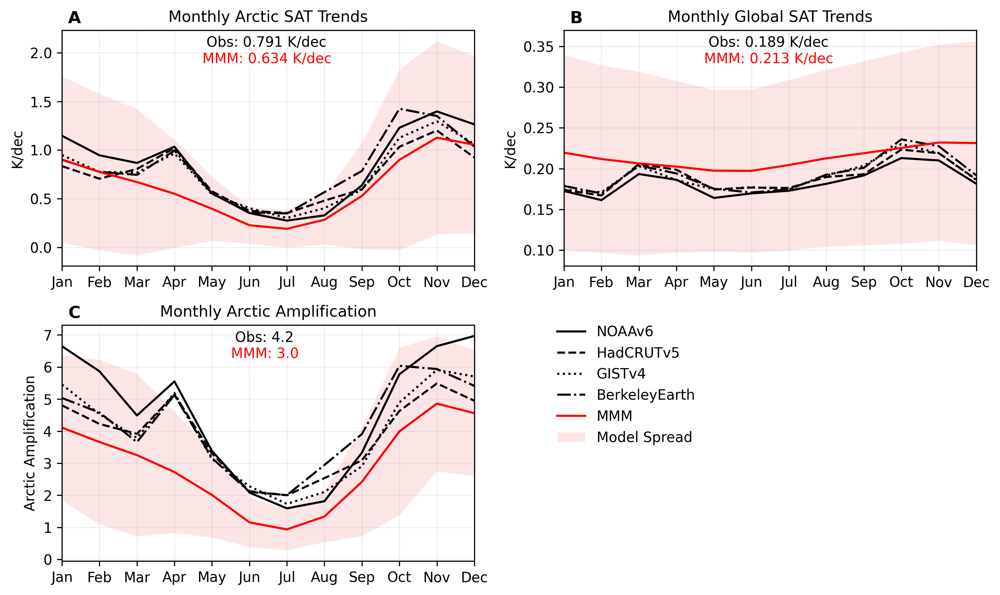

In [88]:
fig, axes = plt.subplots(2, 2, figsize=(10, 6), dpi=300, gridspec_kw={'height_ratios': [1, 1]})
fig.delaxes(axes[1, 1])
axes = axes.ravel()[:3]

labels = ['A', 'B', 'C']
for i, axs in enumerate(axes):
    # Plot observations
    for obs in range(4):
        if i == 0:
            axs.plot(obs_array[i][obs], color='k', linestyle=linestyles[obs], label=obs_names[obs])
        else:
            axs.plot(obs_array[i][obs], color='k', linestyle=linestyles[obs])

    # Plot model means and 2 sigma interval
    if i == 0:
        axs.plot(MMM_array[i], color='r', label='MMM')
        axs.fill_between(range(12), MMM_array[i] - 2 * MMM_std_array[i], MMM_array[i] + 2 * MMM_std_array[i],
                     label='Model Spread', color='lightcoral', edgecolor='white', alpha=0.2)
    else:
        axs.plot(MMM_array[i], color='r')
        axs.fill_between(range(12), MMM_array[i] - 2 * MMM_std_array[i], MMM_array[i] + 2 * MMM_std_array[i], color='lightcoral', edgecolor='white', alpha=0.2)

    # Add annual means
    if i in [0, 1]:
        axs.text(0.35, 0.93, f'Obs: {obs_annual_means[i]} K/dec', transform=axs.transAxes, ha='left', fontsize=10)
        axs.text(0.34, 0.86, f'MMM: {MMM_annual_means[i]} K/dec', color='r', transform=axs.transAxes, ha='left', fontsize=10)
    else:
        axs.text(0.42, 0.93, f'Obs: {obs_annual_means[i]}', transform=axs.transAxes, ha='left', fontsize=10)
        axs.text(0.41, 0.86, f'MMM: {MMM_annual_means[i]}', color='r', transform=axs.transAxes, ha='left', fontsize=10)

    # Plot adjustments
    axs.grid(alpha=0.2)
    axs.set_xticks(range(12))
    axs.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    axs.set_xlim([0, 11])
    axs.set_ylabel(y_labels[i])
    axs.set_title(titles[i], fontsize=11)
    axs.text(0.03, 1.05, str(labels[i]), transform=axs.transAxes, ha='center', va='center', fontsize=12, fontweight='bold')

# Create legend
fig.legend(loc='upper center', bbox_to_anchor=(0.625, 0.475), frameon=False)

plt.tight_layout()
# plt.savefig('./figures/finalv3/Fig1_MonthlyPlots_Bootstrap.png', dpi=300)
plt.show()

In [80]:
arctic_spring, global_spring, arctic_all, global_all = [], [], [], []
for i in range(len(all_members_arctic_sat)):
    arctic_all.append(all_members_arctic_sat[i])
    global_all.append(all_members_global_sat[i])
    arctic_spring.append(all_members_arctic_sat[i][:, 2:5])
    global_spring.append(all_members_global_sat[i][:, 2:5])

arctic_con = np.concatenate(arctic_all, axis=0)
global_con = np.concatenate(global_all, axis=0)
arctic_spring_con = np.concatenate(arctic_spring, axis=0)
global_spring_con = np.concatenate(global_spring, axis=0)

np.shape(arctic_con), np.shape(global_con)

((321, 12), (321, 12))

In [81]:
sel_idx = []
for i in range(len(arctic_con)):
    march_aa = np.divide(arctic_con[i, 2], global_con[i, 2])
    april_aa = np.divide(arctic_con[i, 3], global_con[i, 3])
    may_aa = np.divide(arctic_con[i, 4], global_con[i, 4])
    if april_aa > march_aa:
        if april_aa > may_aa:
            sel_idx.append(i)

arctic_sel = arctic_con[sel_idx]
global_sel = global_con[sel_idx]
aa_sel = np.divide(arctic_sel, global_sel)

sel_array = [arctic_sel, global_sel, aa_sel]
arctic_sel.shape, global_sel.shape, aa_sel.shape

((83, 12), (83, 12), (83, 12))

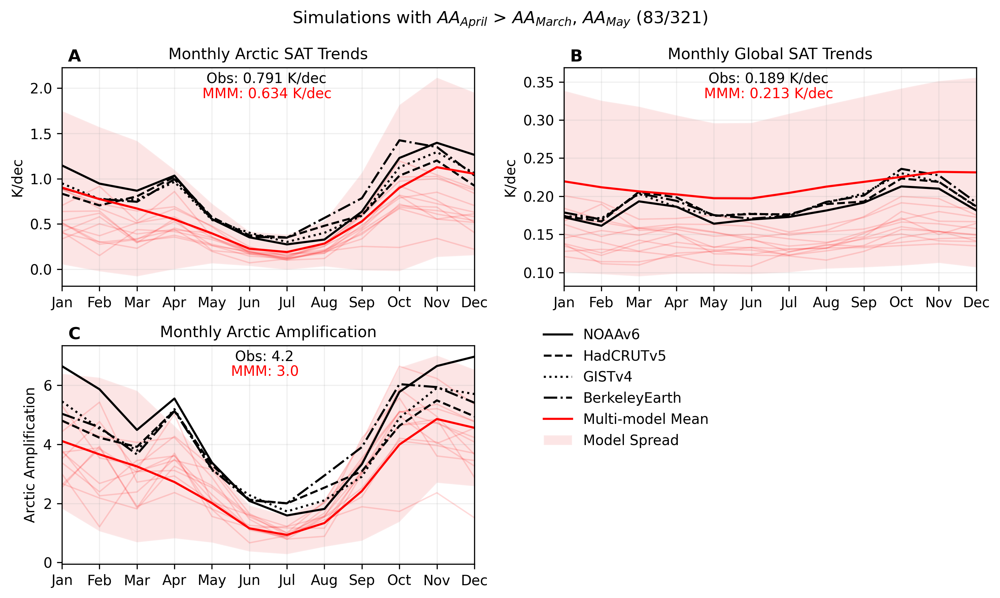

In [87]:
fig, axes = plt.subplots(2, 2, figsize=(10, 6), dpi=300, gridspec_kw={'height_ratios': [1, 1]})
fig.delaxes(axes[1, 1])
axes = axes.ravel()[:3]

labels = ['A', 'B', 'C']
for i, axs in enumerate(axes):
    # Plot ensmeble members with April AA > March AA, May AA (peak)
    for member in range(12):
        axs.plot(sel_array[i][member], color='r', linewidth=1, alpha=0.15)

    # Plot observations
    for obs in range(4):
        if i == 0:
            axs.plot(obs_array[i][obs], color='k', linestyle=linestyles[obs], label=obs_names[obs])
        else:
            axs.plot(obs_array[i][obs], color='k', linestyle=linestyles[obs])

    # Plot model means and 2 sigma interval
    if i == 0:
        axs.plot(MMM_array[i], color='r', label='Multi-model Mean')
        axs.fill_between(range(12), MMM_array[i] - 2 * MMM_std_array[i], MMM_array[i] + 2 * MMM_std_array[i],
                         label='Model Spread', color='lightcoral', edgecolor='white', alpha=0.2)

    else:
        axs.plot(MMM_array[i], color='r')
        axs.fill_between(range(12), MMM_array[i] - 2 * MMM_std_array[i], MMM_array[i] + 2 * MMM_std_array[i],
                         color='lightcoral', edgecolor='white', alpha=0.2)

    # Add annual means
    if i in [0, 1]:
        axs.text(0.35, 0.93, f'Obs: {obs_annual_means[i]} K/dec', transform=axs.transAxes, ha='left', fontsize=10)
        axs.text(0.34, 0.86, f'MMM: {MMM_annual_means[i]} K/dec', color='r', transform=axs.transAxes, ha='left', fontsize=10)
    else:
        axs.text(0.42, 0.93, f'Obs: {obs_annual_means[i]}', transform=axs.transAxes, ha='left', fontsize=10)
        axs.text(0.41, 0.86, f'MMM: {MMM_annual_means[i]}', color='r', transform=axs.transAxes, ha='left', fontsize=10)

    # Plot adjustments
    axs.set_xticks(range(12))
    axs.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    axs.set_xlim([0, 11])
    axs.set_ylabel(y_labels[i])
    axs.grid(alpha=0.2)
    axs.set_title(titles[i], fontsize=11)
    axs.text(0.03, 1.05, str(labels[i]), transform=axs.transAxes, ha='center', va='center', fontsize=12, fontweight='bold')

# Create legend
fig.legend(loc='upper center', bbox_to_anchor=(0.625, 0.475), frameon=False)

plt.suptitle('Simulations with $AA_{April}$ > $AA_{March}$, $AA_{May}$ (83/321)')
plt.tight_layout()
# plt.savefig('./figures/finalv3/Fig1_MonthlyPlots_Bootstrap.png', dpi=300)
plt.show()

In [88]:
def compute_radius(ortho, radius_degrees, lat, lon):
    phi1 = lat + radius_degrees if lat <= 0 else lat - radius_degrees
    _, y1 = ortho.transform_point(lon, phi1, ccrs.PlateCarree())
    return abs(y1)


# Spatial plot settings
transform = ccrs.PlateCarree()
projection = ccrs.NorthPolarStereo()

# Define projection used to display the circle
lat_draw = 51.4198101
lon_draw = -0.950854653584
proj = ccrs.Orthographic(central_longitude=lon_draw, central_latitude=lat_draw)

# Compute required radius in projection native coordinates
r_ortho60 = compute_radius(proj, 30, lat_draw, lon_draw)
r_ortho70 = compute_radius(proj, 20, lat_draw, lon_draw)

sat_maps_con = np.concatenate(mod_spring_months_maps_sat, axis=0)
slp_maps_con = np.concatenate(mod_spring_months_maps_slp, axis=0)

sat_maps_sel = np.nanmean(sat_maps_con[sel_idx], axis=0)
slp_maps_sel = np.nanmean(slp_maps_con[sel_idx], axis=0)

sat_maps_sel.shape, slp_maps_sel.shape

((12, 72, 144), (12, 72, 144))

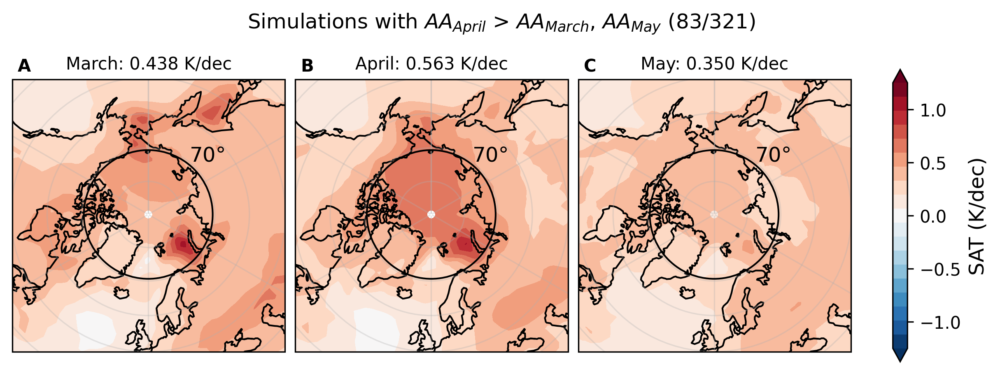

In [93]:
fig, axes = plt.subplots(1, 3, figsize=(8, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()
levels = np.linspace(-1.25, 1.25, 20)

labels = ['March', 'April', 'May']
letters = ['A', 'B', 'C']
spatial_means = spatial_average(sat_maps_sel[:, 64:], lats[64:])

for i in range(3):
    map_cyclic, lon = add_cyclic_point(sat_maps_sel[i+2], coord=lons)
    im = axes[i].contourf(lon, lats, map_cyclic, levels=levels,
                          cmap='RdBu_r', extend='both',
                          projection=projection, transform=transform)
    axes[i].add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70,
                                      facecolor='None', edgecolor='k', linewidth=1,
                                      zorder=30, transform=projection))
    axes[i].set_extent([0, 360, 50, 90], crs=transform)
    axes[i].coastlines(resolution='110m')
    axes[i].gridlines(alpha=0.3)
    axes[i].text(0.65, 0.7, '70°', transform=axes[i].transAxes, fontsize=12)
    axes[i].set_title(f'{labels[i]}: {spatial_means[i+2]:.3f} K/dec', fontsize=10)
    axes[i].text(0.02, 1.03, letters[i], transform=axes[i].transAxes, fontsize=10, fontweight='bold')

cbar = plt.colorbar(im, ax=axes, location='right', shrink=0.4, aspect=20)
cbar.set_label('SAT (K/dec)', fontsize=12)
cbar.ax.tick_params(labelsize=10)
cbar.ax.set_yticks(np.linspace(-1, 1, 5))

plt.suptitle('Simulations with $AA_{April}$ > $AA_{March}$, $AA_{May}$ (83/321)', y=0.775)
plt.show()

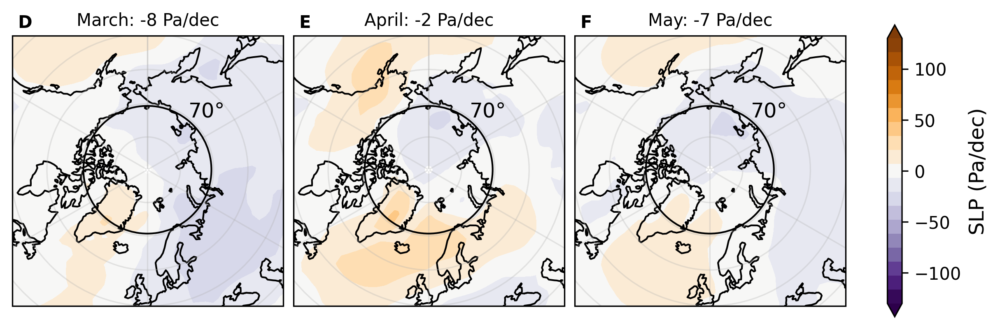

In [92]:
fig, axes = plt.subplots(1, 3, figsize=(8, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()
levels = np.linspace(-130, 130, 20)

labels = ['March', 'April', 'May']
letters = ['D', 'E', 'F']
spatial_means = spatial_average(slp_maps_sel[:, 64:], lats[64:])

for i in range(3):
    map_cyclic, lon = add_cyclic_point(slp_maps_sel[i+2], coord=lons)
    im = axes[i].contourf(lon, lats, map_cyclic, levels=levels,
                          cmap='PuOr_r', extend='both',
                          projection=projection, transform=transform)

    axes[i].add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70,
                                      facecolor='None', edgecolor='k', linewidth=1,
                                      zorder=30, transform=projection))
    axes[i].set_extent([0, 360, 50, 90], crs=transform)
    axes[i].coastlines(resolution='110m')
    axes[i].gridlines(alpha=0.3)
    axes[i].text(0.65, 0.7, '70°', transform=axes[i].transAxes, fontsize=12)
    axes[i].set_title(f'{labels[i]}: {spatial_means[i+2]:.0f} Pa/dec', fontsize=10)
    axes[i].text(0.02, 1.03, letters[i], transform=axes[i].transAxes, fontsize=10, fontweight='bold')

cbar = plt.colorbar(im, ax=axes, location='right', shrink=0.4, aspect=20)
cbar.set_label('SLP (Pa/dec)', fontsize=12)
cbar.ax.tick_params(labelsize=10)
cbar.ax.set_yticks(np.linspace(-100, 100, 5))

plt.show()

#### Different Lats Supplementary Figure

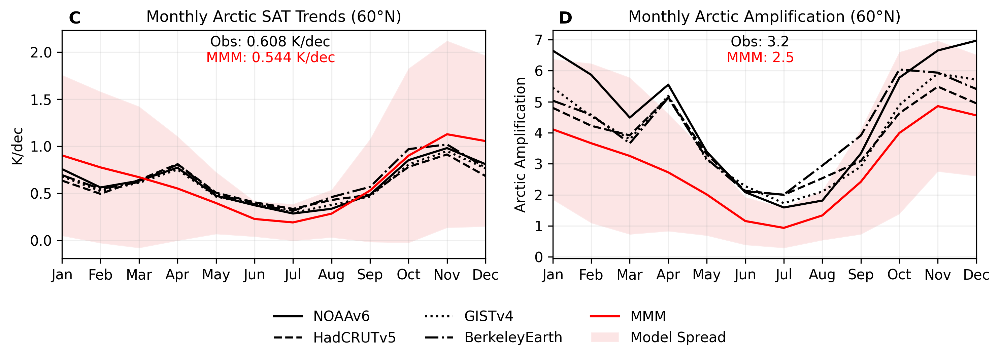

In [108]:
# Create arrays for subplots
obs_array = [obs_arctic_monthly_all, obs_aa_monthly_all]
MMM_array = [MMM_arctic_monthly, MMM_aa_monthly]
MMM_std_array = [arctic_sigma, aa_sigma]

obs_annual_means = [np.round(obs_arctic_monthly_mean, 3),
                    np.round(obs_aa_monthly, 1)]

MMM_annual_means = [np.round(mod_arctic_monthly_mean, 3),
                    np.round(mod_monthly_aa, 1)]

# Plot labels
titles = ['Monthly Arctic SAT Trends (60°N)', 'Monthly Arctic Amplification (60°N)']
y_labels = ['K/dec', 'Arctic Amplification']
linestyles = ['-', '--', ':', '-.']

fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)
axes = axes.ravel()

labels = ['C', 'D']
for i, axs in enumerate(axes):
    # Plot observations
    for obs in range(4):
        if i == 0:
            axs.plot(obs_array[i][obs], color='k', linestyle=linestyles[obs], label=obs_names[obs])
        else:
            axs.plot(obs_array[i][obs], color='k', linestyle=linestyles[obs])

    # Plot model means and 2 sigma interval
    if i == 0:
        axs.plot(MMM_array[i], color='r', label='MMM')
        axs.fill_between(range(12), MMM_array[i] - 2 * MMM_std_array[i], MMM_array[i] + 2 * MMM_std_array[i], color='lightcoral', edgecolor='white', alpha=0.2, label='Model Spread')
    else:
        axs.plot(MMM_array[i], color='r')
        axs.fill_between(range(12), MMM_array[i] - 2 * MMM_std_array[i], MMM_array[i] + 2 * MMM_std_array[i], color='lightcoral', edgecolor='white', alpha=0.2)

    # Add annual means
    if i == 0:
        axs.text(0.35, 0.93, f'Obs: {obs_annual_means[i]} K/dec', transform=axs.transAxes, ha='left', fontsize=10)
        axs.text(0.34, 0.86, f'MMM: {MMM_annual_means[i]} K/dec', color='r', transform=axs.transAxes, ha='left', fontsize=10)
    else:
        axs.text(0.42, 0.93, f'Obs: {obs_annual_means[i]}', transform=axs.transAxes, ha='left', fontsize=10)
        axs.text(0.41, 0.86, f'MMM: {MMM_annual_means[i]}', color='r', transform=axs.transAxes, ha='left', fontsize=10)

    # Plot adjustments
    axs.grid(alpha=0.2)
    axs.set_xticks(range(12))
    axs.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    axs.set_xlim([0, 11])
    axs.set_ylabel(y_labels[i])
    axs.set_title(titles[i], fontsize=11)
    axs.text(0.03, 1.05, str(labels[i]), transform=axs.transAxes, ha='center', va='center', fontsize=12, fontweight='bold')

# Create legend
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0), ncols=3, frameon=False)

plt.tight_layout()
# plt.savefig('./figures/finalv3/FigS1AB_MonthlyPlots_65N_Bootstrap.png', dpi=300)
plt.show()

### Figure 2. Spring AA Spatial Patterns

In [12]:
# Spring AA

# Observations
# Observation Mean Spatial Map
OBS_mean_AA_spatial = np.divide(OBS_mean_globe_spatial_trend, OBS_mean_globe_spring_trend)

# Observation Mean Spring AA (60 and 70 N)
OBS_AA60_spring = np.divide(OBS_mean_arc60_spring_trend, OBS_mean_globe_spring_trend)
OBS_AA70_spring = np.divide(OBS_mean_arc70_spring_trend, OBS_mean_globe_spring_trend)

# Models
# MMM Spatial Map
MMM_AA_spatial = np.divide(MMM_globe_spatial_trend, MMM_globe_spring_trend)

# MMM Spring AA (60 and 70 N)
MMM_AA60_spring = np.divide(MMM_arc60_spring_trend, MMM_globe_spring_trend)
MMM_AA70_spring = np.divide(MMM_arc70_spring_trend, MMM_globe_spring_trend)

print(f'Obs Mean AA60:  {OBS_AA60_spring:.1f}')
print(f'Obs Mean AA70:  {OBS_AA70_spring:.1f}')
print(f'CMIP6 MMM AA70: {MMM_AA70_spring:.1f}')

Obs Mean AA60:  3.4
Obs Mean AA70:  4.2
CMIP6 MMM AA70: 2.7


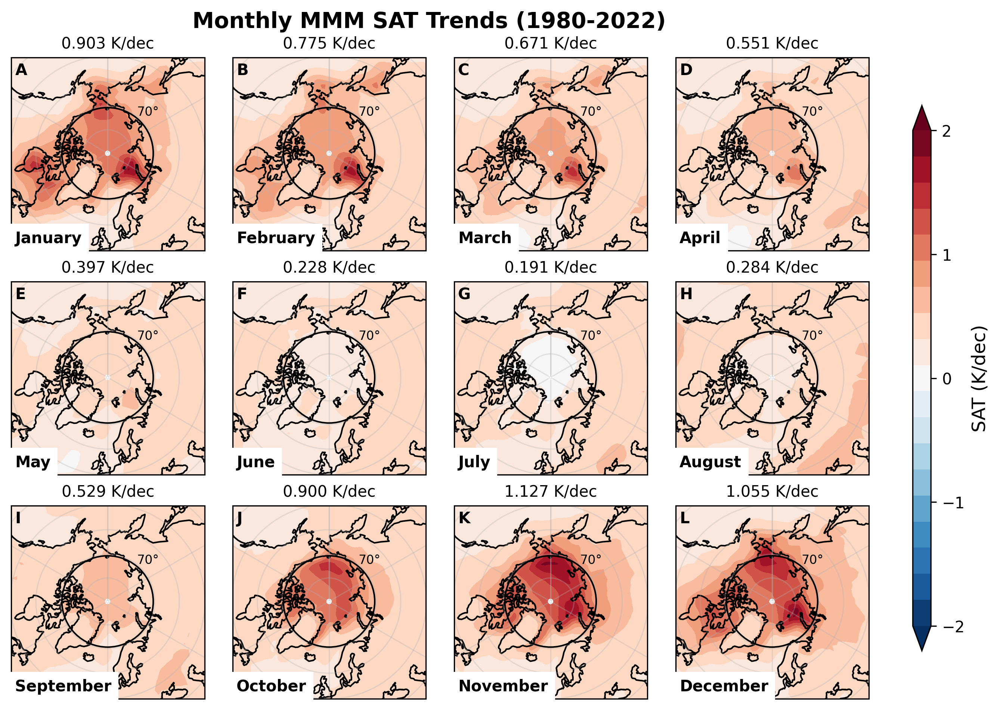

In [24]:
# Models
model_SAT_means, model_SLP_means = [], []
for i in range(len(mod_spring_months_maps_sat)):
    model_SAT_means.append(np.nanmean(mod_spring_months_maps_sat[i], axis=0))
    model_SLP_means.append(np.nanmean(mod_spring_months_maps_slp[i], axis=0))

models_SAT_mean = np.nanmean(model_SAT_means, axis=0)
models_SLP_mean = np.nanmean(model_SLP_means, axis=0)

sptl_avgs = spatial_average(models_SAT_mean[:, 64:], lats[64:])

labels = ['A', 'B', 'C',
          'D', 'E', 'F',
          'G', 'H', 'I',
          'J', 'K', 'L']
months = ['January', 'February', 'March',
          'April', 'May', 'June',
          'July', 'August', 'September',
          'October', 'November', 'December']

fig, axes = plt.subplots(3, 4, figsize=(9, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()
levels = np.linspace(-2, 2, 20)
# levels = np.linspace(-300, 300, 20)

for i in range(12):
    MMM_map_cyclic, lon = add_cyclic_point(models_SAT_mean[i], coord=lons)
    im = axes[i].contourf(lon, lats, MMM_map_cyclic, levels=levels,
                          cmap='RdBu_r', extend='both',
                          projection=projection, transform=transform)
    axes[i].add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                      edgecolor='k', lw=1, zorder=30, transform=projection))
    axes[i].set_extent([0, 360, 50, 90], crs=transform)
    axes[i].coastlines(resolution='110m')
    axes[i].gridlines(alpha=0.3)
    axes[i].text(0.02, 0.91, labels[i], transform=axes[i].transAxes, fontsize=10, fontweight='bold')
    axes[i].text(0.02, 0.04, months[i], transform=axes[i].transAxes, fontsize=10, fontweight='bold', backgroundcolor='white')
    axes[i].text(0.65, 0.7, '70°', transform=axes[i].transAxes, fontsize=8)
    axes[i].set_title(f'{sptl_avgs[i]:.3f} K/dec', fontsize=10)

cbar = plt.colorbar(im, ax=axes, location='right', shrink=0.85, aspect=30)
cbar.set_label('SAT (K/dec)', fontsize=12)
cbar.ax.tick_params(labelsize=10)
cbar.ax.set_yticks(np.linspace(-2, 2, 5))
# cbar.ax.set_yticks(np.linspace(-300, 300, 5))
plt.suptitle('Monthly MMM SAT Trends (1980-2022)', x=0.4375, y=1.03, fontsize=14, fontweight='bold')
plt.show()

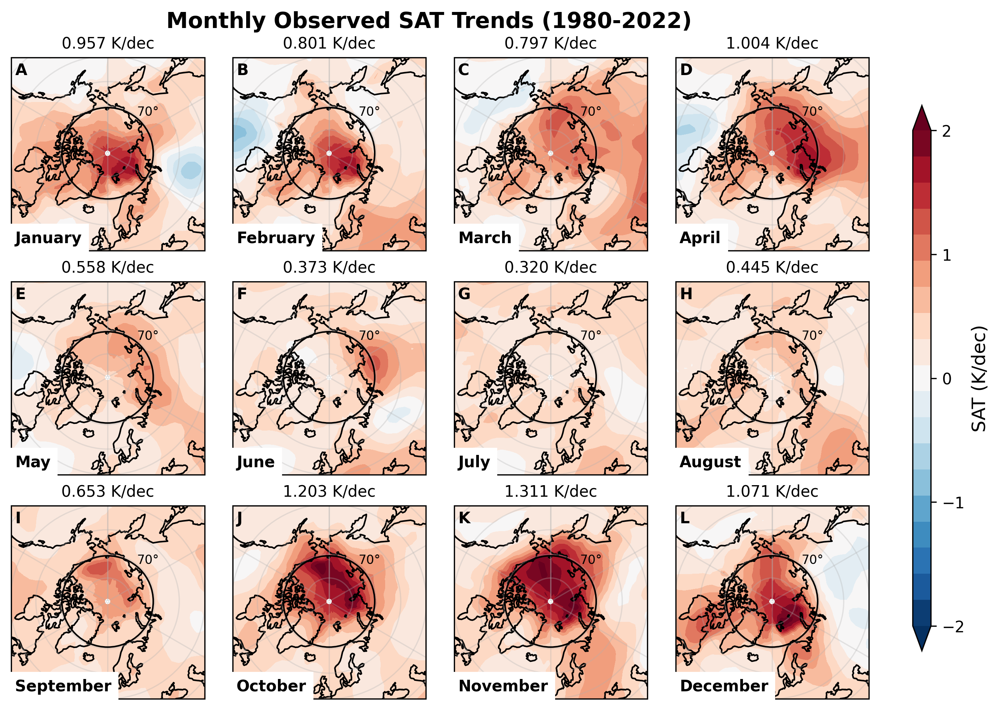

In [25]:
# Observations
obs_SAT_mean = np.nanmean(obs_spring_months_maps_sat, axis=0)
obs_SLP_mean = np.nanmean(obs_spring_months_maps_slp, axis=0)

sptl_avgs = spatial_average(obs_SAT_mean[:, 64:], lats[64:])

labels = ['A', 'B', 'C',
          'D', 'E', 'F',
          'G', 'H', 'I',
          'J', 'K', 'L']
months = ['January', 'February', 'March',
          'April', 'May', 'June',
          'July', 'August', 'September',
          'October', 'November', 'December']

fig, axes = plt.subplots(3, 4, figsize=(9, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()
levels = np.linspace(-2, 2, 20)
# levels = np.linspace(-300, 300, 20)

for i in range(12):
    OBS_map_cyclic, lon = add_cyclic_point(obs_SAT_mean[i], coord=lons)
    im = axes[i].contourf(lon, lats, OBS_map_cyclic, levels=levels,
                          cmap='RdBu_r', extend='both',
                          projection=projection, transform=transform)
    axes[i].add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                      edgecolor='k', lw=1, zorder=30, transform=projection))
    axes[i].set_extent([0, 360, 50, 90], crs=transform)
    axes[i].coastlines(resolution='110m')
    axes[i].gridlines(alpha=0.3)
    axes[i].text(0.02, 0.91, labels[i], transform=axes[i].transAxes, fontsize=10, fontweight='bold')
    axes[i].text(0.02, 0.04, months[i], transform=axes[i].transAxes, fontsize=10, fontweight='bold', backgroundcolor='white')
    axes[i].text(0.65, 0.7, '70°', transform=axes[i].transAxes, fontsize=8)
    axes[i].set_title(f'{sptl_avgs[i]:.3f} K/dec', fontsize=10)

cbar = plt.colorbar(im, ax=axes, location='right', shrink=0.85, aspect=30)
cbar.set_label('SAT (K/dec)', fontsize=12)
cbar.ax.tick_params(labelsize=10)
cbar.ax.set_yticks(np.linspace(-2, 2, 5))
# cbar.ax.set_yticks(np.linspace(-300, 300, 5))
plt.suptitle('Monthly Observed SAT Trends (1980-2022)', x=0.4375, y=1.03, fontsize=14, fontweight='bold')
plt.show()

In [26]:
obs_SLP_mean_average = spatial_average(obs_SLP_mean[:, 64:], lats[64:])
np.round(np.nanmean(obs_SLP_mean_average[2:4]), 0)

-65.0

In [27]:
model_means = []
for i in range(len(mod_spring_months_maps_slp)):
    model_mean = np.nanmean(mod_spring_months_maps_slp[i], axis=0)
    model_means.append(model_mean)
np.shape(model_means)

(9, 12, 72, 144)

In [28]:
model_means = np.array(model_means)
mod_average = spatial_average(model_means[:, :, 64:], lats[64:])
np.round(np.nanmean(mod_average[:, 2:4]), 0)

-8.0

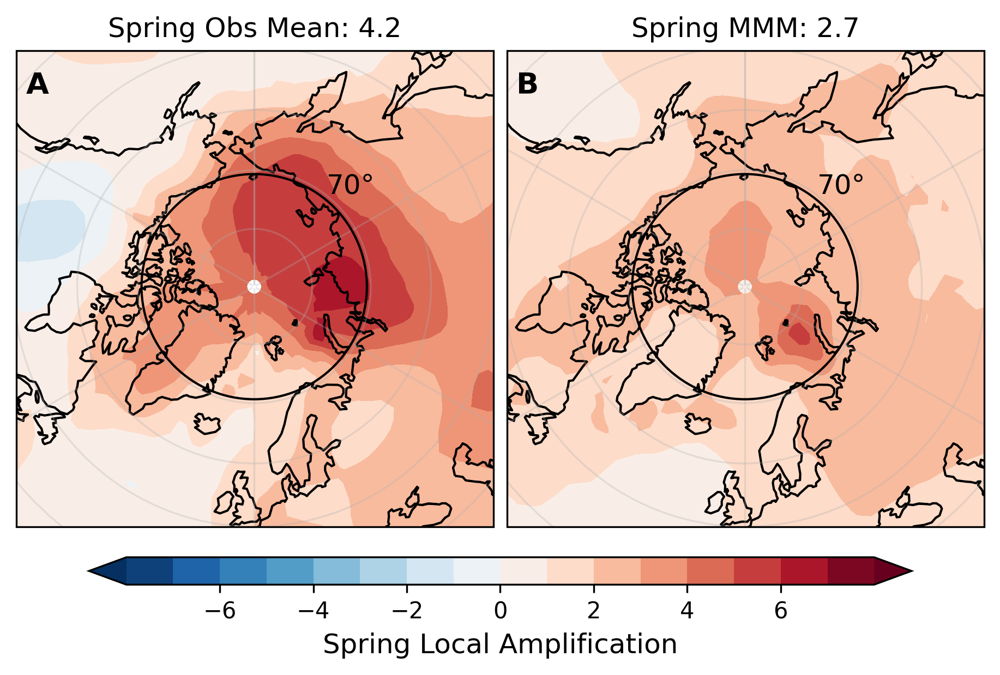

In [16]:
# Define the colormap and normalization
cmap = 'RdBu_r'
levels = np.linspace(-8, 8, 17)
ticks = np.linspace(-6, 6, 7)

fig, axes = plt.subplots(1, 2, figsize=(6, 4), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()

OBS_map_cyclic, lon = add_cyclic_point(OBS_mean_AA_spatial, coord=lons)
im1 = axes[0].contourf(lon, lats, OBS_map_cyclic, levels=levels,
                       cmap=cmap, projection=projection, transform=transform)
axes[0].set_title(f'Spring Obs Mean: {OBS_AA70_spring:.1f}', fontsize=12)

MMM_map_cyclic, lon = add_cyclic_point(MMM_AA_spatial, coord=lons)
im2 = axes[1].contourf(lon, lats, MMM_map_cyclic, levels=levels,
                       cmap=cmap, extend='both', projection=projection, transform=transform)
axes[1].set_title(f'Spring MMM: {MMM_AA70_spring:.1f}', fontsize=12)

cbar = plt.colorbar(im2, ax=axes, location='bottom', shrink=0.85, aspect=30, ticks=ticks)
cbar.set_label('Spring Local Amplification', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# All panels
labels = ['A', 'B']
for i, axs in enumerate(axes):
    axs.add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                  edgecolor='k', lw=1, zorder=30, transform=projection))
    axs.set_extent([0, 360, 50, 90], crs=transform)
    axs.coastlines(resolution='110m')
    axs.gridlines(alpha=0.3)
    axs.text(0.02, 0.91, labels[i], transform=axs.transAxes, fontsize=13, fontweight='bold')
    axs.text(0.65, 0.7, '70°', transform=axs.transAxes, fontsize=12)

# plt.savefig('./figures/finalv3/Fig2_AA_Maps.png', dpi=300, bbox_inches='tight')
plt.show()

### Figure 3. Spring Histogram (Before)

In [13]:
# Observations
obs_arc70_dist = obs_arc70_spring_trends
obs_globe_dist = obs_globe_spring_trends
obs_aa70_dist = np.divide(obs_arc70_spring_trends, obs_globe_spring_trends)

# Models
mod_arc70_dist, mod_globe_dist, mod_aa70_dist = [], [], []
for i in range(9):
    one_model_arc70 = spatial_average(np.array(mod_arc70_spatial_trends[i]), lats[64:])
    one_model_globe = spatial_average(np.array(mod_globe_spatial_trends[i]), lats)
    mod_arc70_dist.append(one_model_arc70)
    mod_globe_dist.append(one_model_globe)
    mod_aa70_dist.append(np.divide(one_model_arc70, one_model_globe))
    print(f'{model_names[i]} {np.nanmean(mod_aa70_dist[i]):.2f}')

# Rerank models in terms of AA magnitude for 70N-90N
models_reranked = ['E3SM-2-0',
                   'CanESM5',
                   'MIROC6',
                   'MPI-ESM1-2-LR',
                   'IPSL-CM6A-LR',
                   'OthersAllEM',
                   'ACCESS-ESM1-5',
                   'CESM2',
                   'CESM2_SMBB']

# Get new ranked indices
ranked_indices = []
for name in models_reranked:
    ranked_indices.append(model_names.index(name))

# Rerank distributions
mod_arc70_dist = [mod_arc70_dist[i] for i in ranked_indices]
mod_globe_dist = [mod_globe_dist[i] for i in ranked_indices]
mod_aa70_dist = [mod_aa70_dist[i] for i in ranked_indices]
new_model_names = [model_names[i] for i in ranked_indices]

# Get concatenations of distributions for normal distribution (all ensemble members together)
mod_arc70_con = np.concatenate(mod_arc70_dist, axis=0)
mod_globe_con = np.concatenate(mod_globe_dist, axis=0)
mod_aa70_con = np.concatenate(mod_aa70_dist, axis=0)

# Calculate percent
count, total = 0, 0
for AA in mod_arc70_con:
    total += 1
    if min(obs_arc70_dist) <= AA:
    # if AA <= np.nanmean(obs_arc70_dist):
        count += 1

print(f'\nFraction of ensemble members greater than min observed AA: {count}/{total} ({(count/total)*100:.0f}%)\n')
print('Arctic:', len(mod_arc70_con), len(mod_arc70_dist), len(obs_arc70_dist))
print('Global:', len(mod_globe_con), len(mod_globe_dist), len(obs_globe_dist))
print('AA:    ', len(mod_aa70_con), len(mod_aa70_dist), len(obs_aa70_dist))

MPI-ESM1-2-LR 2.71
MIROC6 3.01
CESM2 2.08
IPSL-CM6A-LR 2.47
ACCESS-ESM1-5 2.20
CanESM5 3.12
CESM2_SMBB 1.94
E3SM-2-0 3.65
OthersAllEM 2.46

Fraction of ensemble members greater than min observed AA: 44/321 (14%)

Arctic: 321 9 4
Global: 321 9 4
AA:     321 9 4


In [18]:
def plot_hist(mod_con, mod_dist, mod_sigma, mod_names, obs_dist, obs_names, num_bins, xmin, xmax, ymin, ymax, xlabel, ylabel, length, adj):

    fig, axs = plt.subplots(figsize=(4, 4), dpi=300)
    colors = cm.rainbow(np.linspace(0, 1, len(mod_dist)))[::-1]

    # Find normal distribution of models
    mu, std = norm.fit(mod_con)
    bins = np.linspace(xmin, xmax, num_bins)
    p = norm.pdf(bins, mu, std)
    weights = np.ones_like(mod_con) / len(mod_con)

    # Plot normal distribution
    plt.plot(bins, p / np.sum(p), color='gray', linewidth=1.5)

    # Observation linestyle list
    linestyles = ['-', '--', ':', '-.']

    # Plot observations as vertical lines
    for i in range(len(obs_dist)):
        axs.plot(np.repeat(obs_dist[i], 3), [-5, 0.3, 5], linestyle=linestyles[i], linewidth=1.5, color='k', label=f'{obs_names[i]}: {obs_dist[i]:.1f}')

    # Add the observation mean after the last observation
    plt.plot([], [], ' ', label=f'Obs Mean: {OBS_AA70_spring:.1f}\n')  # OBS_AA70_spring, OBS_mean_arc70_spring_trend, OBS_mean_globe_spring_trend

    # Plot histograms for each model
    forced_components = []
    for i, model in enumerate(mod_dist):
        weights = np.ones_like(model) / len(model)
        model_mean = np.nanmean(model)
        model_std = np.nanstd(model)
        forced_components.append(model_mean)

        plt.hist(model,
                 bins=bins,
                 weights=weights,
                 color=colors[i],
                 alpha=0.3,
                 label=f'{mod_names[i]}: {model_mean:.1f} ± {2*model_std:.1f}')

    # Add the observation mean after the last observation
    plt.plot([], [], ' ', label=f'MMM: {MMM_AA70_spring:.1f} ± {2*mod_sigma:.1f}')  # MMM_AA70_spring, MMM_arc70_spring_trend, MMM_globe_spring_trend

    print(np.min(forced_components), np.max(forced_components))

    # Plot adjustments
    plt.grid(alpha=0.3)
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    axs.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), fontsize=9)

    # Plot ticks of model means
    horizontal_line_value = ymax - 0.015
    ax_position = axs.get_position()
    axs2 = plt.axes([ax_position.x0,
                     ax_position.y0,
                     ax_position.x1*0.86,
                     ax_position.y1*0.86],
                    facecolor=(1, 1, 1, 0))
    axs2.hlines(horizontal_line_value,
                xmin=np.nanmin(forced_components),
                xmax=np.nanmax(forced_components),
                colors='gray', lw=1.5)

    # Plot ticks of model means
    for i, forced_component in enumerate(forced_components):
        axs2.vlines(forced_component,
                    ymin=horizontal_line_value-length,
                    ymax=horizontal_line_value+length,
                    colors=colors[i],
                    alpha=0.75,
                    lw=2)

    # Don't show second axis
    axs2.spines['top'].set_visible(False)
    axs2.spines['right'].set_visible(False)
    axs2.spines['bottom'].set_visible(False)
    axs2.spines['left'].set_visible(False)
    axs2.xaxis.set_tick_params(labelbottom=False)
    axs2.yaxis.set_tick_params(labelleft=False)
    axs2.set_xticks([])
    axs2.set_yticks([])
    axs2.set_xlim(xmin, xmax)
    axs2.set_ylim(ymin, ymax)

    # plt.savefig(f'./figures/finalv3/FigS3_Global_Warming_Histogram_Before.png', dpi=300, bbox_inches='tight')
    plt.show()

In [19]:
# Bootstrapping for MMM uncertainties
n = len(mod_arc70_dist)

# Allocate bootstrapped samples arrays
arctic_sigma_bootstrap, global_sigma_bootstrap, aa_sigma_bootstrap = [], [], []

# Bootstrap many, many times
for _ in range(100):
    # Allocate single "bootstrap" sample arrays
    arctic_samples, global_samples, aa_samples = [], [], []
    for i in range(n):
        # Get 10 random ensemble members from each model
        indices = np.random.choice(n, size=10, replace=True)
        arctic_samples.append(mod_arc70_dist[i][indices])
        global_samples.append(mod_globe_dist[i][indices])
        aa_samples.append(mod_arc70_dist[i][indices] / mod_globe_dist[i][indices])

    # Append standard deviations of each "bootstrap" of 90 samples
    arctic_sigma_bootstrap.append(np.std(arctic_samples))
    global_sigma_bootstrap.append(np.std(global_samples))
    aa_sigma_bootstrap.append(np.std(aa_samples))

# Take average of bootstrapped sigmas
arctic_sigma = np.nanmean(arctic_sigma_bootstrap, axis=0)
global_sigma = np.nanmean(global_sigma_bootstrap, axis=0)
aa_sigma = np.nanmean(aa_sigma_bootstrap, axis=0)

arctic_sigma, global_sigma, aa_sigma

(0.2534967690700092, 0.05204904347552754, 0.8312392805532002)

1.9355663651000545 3.6524355285241756


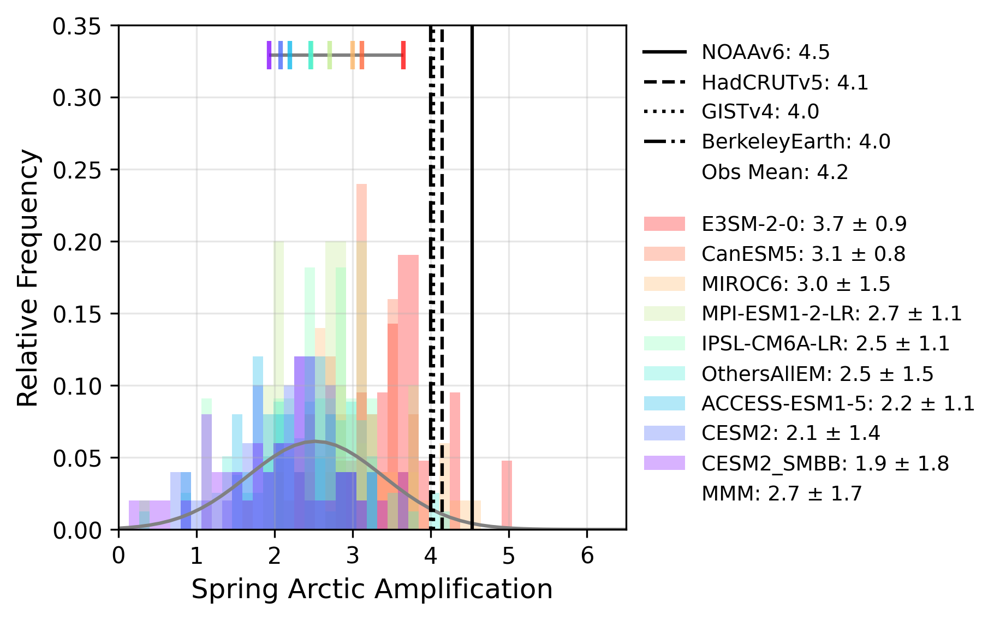

In [20]:
# Arctic Amplification
plot_hist(
    mod_con=mod_aa70_con,
    mod_dist=mod_aa70_dist,
    mod_sigma=aa_sigma,
    mod_names=new_model_names,
    obs_dist=obs_aa70_dist,
    obs_names=obs_names,
    num_bins=50,
    xmin=0,
    xmax=6.5,
    ymin=0,
    ymax=0.35,
    xlabel="Spring Arctic Amplification",
    ylabel="Relative Frequency",
    length=0.01,
    adj=0.02,
)

0.39424574858839556 0.9597649185454741


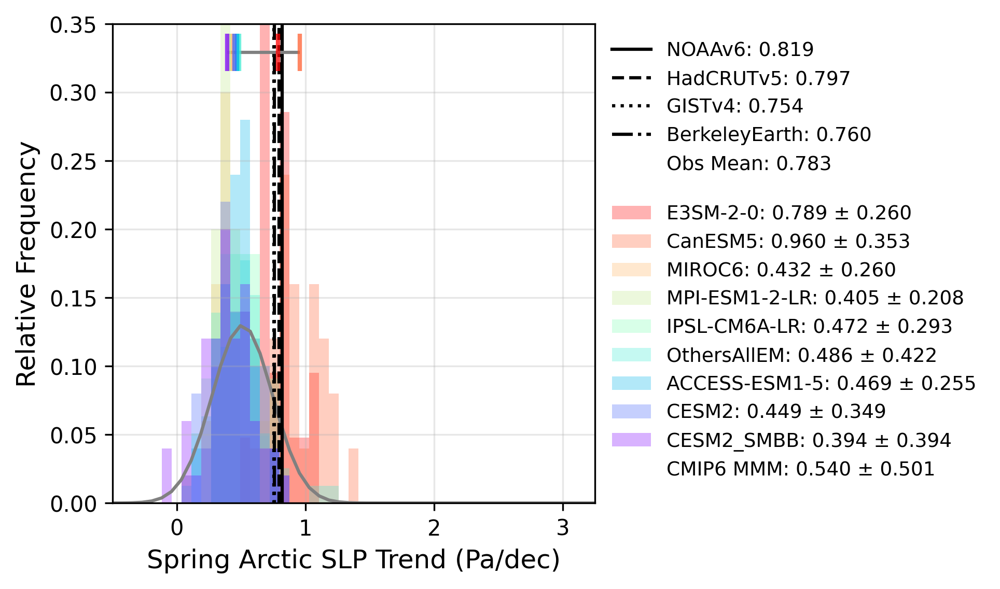

In [23]:
# Arctic Warming
plot_hist(
    mod_con=mod_arc70_con,
    mod_dist=mod_arc70_dist,
    mod_sigma=arctic_sigma,
    mod_names=new_model_names,
    obs_dist=obs_arc70_dist,
    obs_names=obs_names,
    num_bins=50,
    xmin=-0.5,
    xmax=3.25,
    ymin=0,
    ymax=0.35,
    xlabel="Spring Arctic SLP Trend (Pa/dec)",
    ylabel="Relative Frequency",
    length=0.014,
    adj=0.025,
)

0.14201869530370964 0.30606639522771145


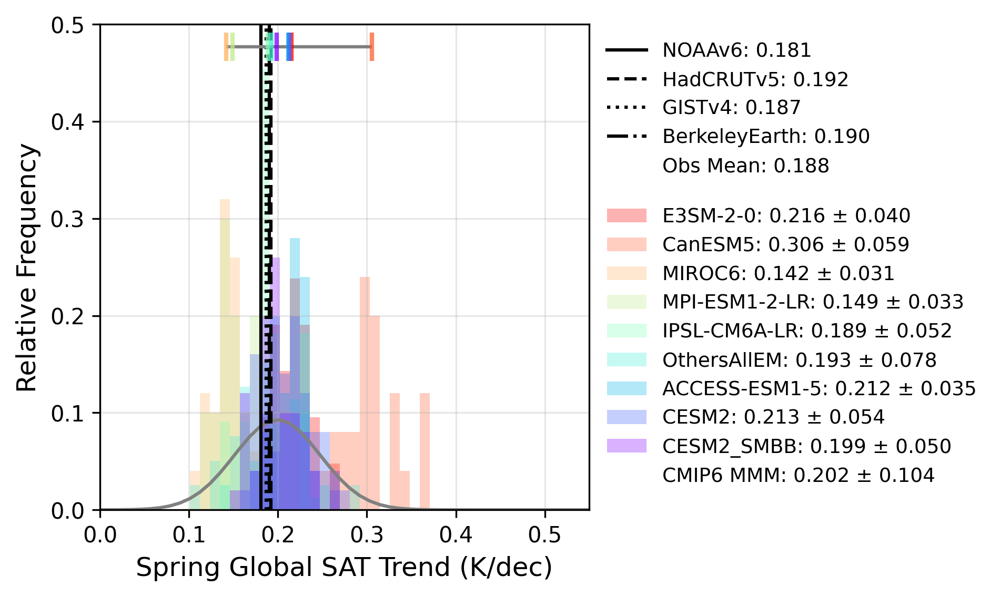

In [25]:
# Global Warming
plot_hist(
    mod_con=mod_globe_con,
    mod_dist=mod_globe_dist,
    mod_sigma=global_sigma,
    mod_names=new_model_names,
    obs_dist=obs_globe_dist,
    obs_names=obs_names,
    num_bins=50,
    xmin=0,
    xmax=0.55,
    ymin=0,
    ymax=0.5,
    xlabel="Spring Global SAT Trend (K/dec)",
    ylabel="Relative Frequency",
    length=0.015,
    adj=0.025,
)

### Figure 4. CNN Results

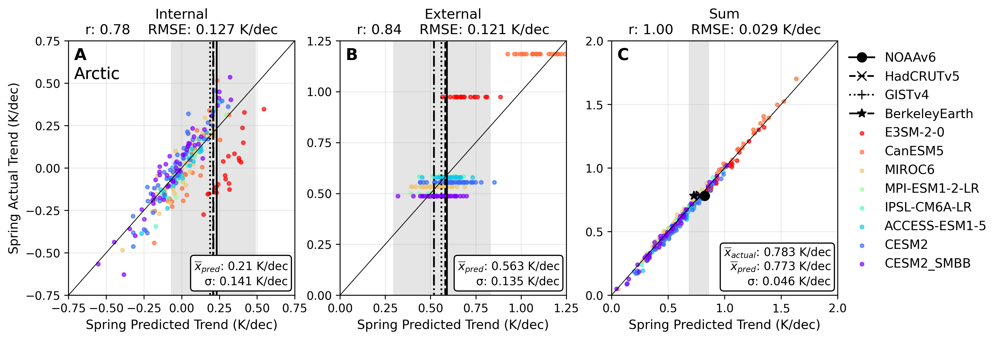

In [48]:
# Plot customizations
titles = ['Internal', 'External', 'Sum']
obs_labels = ['NOAAv6', 'HadCRUTv5', 'GISTv4', 'BerkeleyEarth']
obs_markers = ['o', 'x', '+', '*']
linestyles = ['-', '--', ':', '-.']
colors = cm.rainbow(np.linspace(0, 1, 8))[::-1]
bbox = dict(facecolor='white', ec='black', boxstyle='round')

# Input by hand
new_errors_std = [0.13879034, 0.1308759, 0.02772822]

dir = glob.glob(f'/global/homes/s/skygale/workspace/preds_and_vals/FINAL_FINAL/run_2_arctic_*')

# Models
cv_preds_and_vals, get_model_names = [], []
for path in dir:
    cv_preds_and_vals.append(np.load(path))
    model_name = path.split('/')[8][13:-4]
    get_model_names.append(model_name)

# Rerank models in terms of AA magnitude
models_reranked = ['E3SM-2-0',
                   'CanESM5',
                   'MIROC6',
                   'MPI-ESM1-2-LR',
                   'IPSL-CM6A-LR',
                   'ACCESS-ESM1-5',
                   'CESM2',
                   'CESM2_SMBB']

# Get new ranked indices
ranked_indices = []
for name in models_reranked:
    ranked_indices.append(get_model_names.index(name))

cv_preds_and_vals = [cv_preds_and_vals[i] for i in ranked_indices]
get_model_names = [get_model_names[i] for i in ranked_indices]

# Observations
cv_obs = np.load(f'/global/homes/s/skygale/workspace/preds_and_vals/FINAL_FINAL/run_2_Arctic_obs.npy')

# Actual observed values
actual_obs = np.nanmean(obs_arc70_spring_trends)

# Plot customizations
labels = ['A', 'B', 'C']
ticks = np.arange(-0.75, 0.751, 0.25),  np.arange(0, 1.251, 0.25), np.arange(0, 2.1, 0.5)

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=300, facecolor='white')
cv_preds_and_vals_ = cv_preds_and_vals
cv_obs_ = np.swapaxes(np.array(cv_obs), 0, 2)

for i in range(3):
    axs[0].text(0.025, 0.85, 'Arctic', fontsize=14, transform=axs[0].transAxes)
    all_obs_spread = np.nanmean(cv_obs_[:, i, :], 1).ravel()
    obs_mean = np.nanmean(all_obs_spread)
    sigma_obs = np.nanstd(all_obs_spread)
    sigma_cnn = new_errors_std[i]
    sigma = np.sqrt(sigma_obs**2+sigma_cnn**2)
    axs[i].axvspan(obs_mean-2*sigma, obs_mean+2*sigma, color='grey', alpha=0.2, ec=None)
    cv_obs_set = cv_obs_[:, i, :].reshape(4, 3, 8) if region == 'Arctic' else cv_obs_[:, i, :].reshape(4, 8)
    mean = str(round(obs_mean, 3))
    std = str(round(sigma, 3))

    if i in [0, 1]:
        text = '$\overline{x}$$_{pred}$: '+mean+' K/dec\nσ: '+std+' K/dec'
        axs[i].text(0.97, 0.03, text, transform=axs[i].transAxes, fontsize=10, va='bottom', ha='right', bbox=bbox)
        for idx in range(len(cv_obs_set)):
            obs_set_all_cv = cv_obs_set[idx]
            mean_obs = np.nanmean(obs_set_all_cv)
            axs[i].plot(np.repeat(mean_obs, 3), [-5, 0.3, 5], linestyle=linestyles[idx], linewidth=1.5, color='k', label=obs_labels[idx])
    else:
        text = '$\overline{x}$$_{actual}$: '+str(np.round(actual_obs, 3))+' K/dec'+'\n$\overline{x}$$_{pred}$: '+mean+' K/dec\nσ: '+std+' K/dec'
        axs[i].text(0.97, 0.03, text, transform=axs[i].transAxes, fontsize=10,  va='bottom', ha='right', bbox=bbox)
        for idx in range(len(cv_obs_set)):
            obs_set_all_cv = cv_obs_set[idx]
            mean_obs = np.nanmean(obs_set_all_cv)
            axs[i].plot(mean_obs, actual_obs, linestyle=linestyles[idx], marker=obs_markers[idx], markersize=8, color='k', label=obs_labels[idx])

for model_idx, set_of_preds_and_vals in enumerate(cv_preds_and_vals_):
    Y_pred = np.array(set_of_preds_and_vals[0])
    Y_test = np.array(set_of_preds_and_vals[1])

    for i in range(3):
        axs[i].scatter(Y_pred[:, i], Y_test[:, i], color=colors[model_idx], s=10, alpha=0.65, label=get_model_names[model_idx])
        axs[i].axline((0, 0), slope=1, color='k', alpha=0.5, linewidth=0.5)
        axs[i].set_xticks(ticks[i])
        axs[i].set_yticks(ticks[i])
        axs[i].set_ylim(ticks[i][0], ticks[i][-1])
        axs[i].set_xlim(ticks[i][0], ticks[i][-1])

all_preds_and_vals = np.concatenate(cv_preds_and_vals_, axis=1)

for i in range(3):
    Y_pred = all_preds_and_vals[0]
    Y_test = all_preds_and_vals[1]
    MSE = np.nanmean(np.square(Y_pred[:, i]-Y_test[:, i]), 0)
    MSE_str = str(np.around(MSE, 5))
    r = stats.pearsonr(Y_pred[:, i], Y_test[:, i])[0]
    r_str = str(np.around(r, 3))
    axs[i].set_title(titles[i]+'\nr: {:.2f}'.format(round(r, 2))+'    RMSE: {:.3f} K/dec'.format(round(np.sqrt(MSE), 3)), fontsize=12)
    axs[i].set_xlabel('Spring Predicted Trend (K/dec)', fontsize=11)
    axs[0].set_ylabel('Spring Actual Trend (K/dec)', fontsize=11)
    axs[i].grid(alpha=0.25)
    axs[i].tick_params(axis='both', which='major', labelsize=10)
    axs[i].tick_params(axis='both', which='minor', labelsize=10)
    axs[i].text(0.025, 0.925, labels[i], transform=axs[i].transAxes, fontsize=14, fontweight='bold')

axs[2].legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False, fontsize=11)
plt.show()

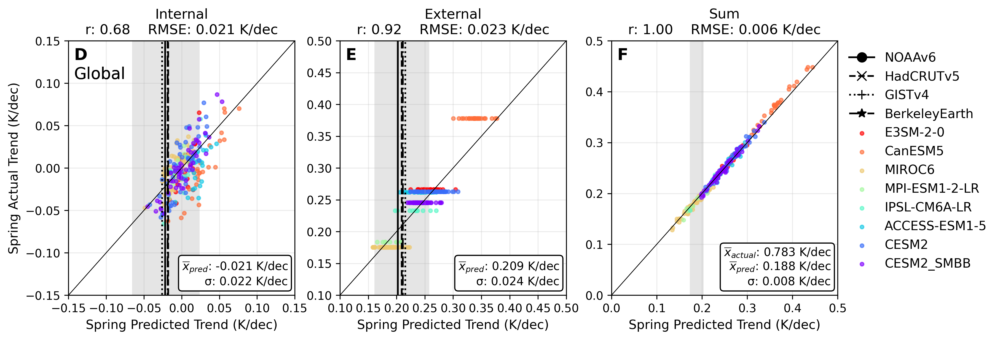

In [51]:
# Plot customizations
titles = ['Internal', 'External', 'Sum']
obs_labels = ['NOAAv6', 'HadCRUTv5', 'GISTv4', 'BerkeleyEarth']
obs_markers = ['o', 'x', '+', '*']
linestyles = ['-', '--', ':', '-.']
colors = cm.rainbow(np.linspace(0, 1, 8))[::-1]
bbox = dict(facecolor='white', ec='black', boxstyle='round')

# Input by hand
new_errors_std = [0.02221387, 0.02384802, 0.00602108]

dir = glob.glob(f'/global/homes/s/skygale/workspace/preds_and_vals/FINAL_FINAL/run_2_global_*')

# Models
cv_preds_and_vals, get_model_names = [], []
for path in dir:
    cv_preds_and_vals.append(np.load(path))
    model_name = path.split('/')[8][13:-4]
    get_model_names.append(model_name)

# Rerank models in terms of AA magnitude
models_reranked = ['E3SM-2-0',
                   'CanESM5',
                   'MIROC6',
                   'MPI-ESM1-2-LR',
                   'IPSL-CM6A-LR',
                   'ACCESS-ESM1-5',
                   'CESM2',
                   'CESM2_SMBB']

# Get new ranked indices
ranked_indices = []
for name in models_reranked:
    ranked_indices.append(get_model_names.index(name))

cv_preds_and_vals = [cv_preds_and_vals[i] for i in ranked_indices]
get_model_names = [get_model_names[i] for i in ranked_indices]

# Observations
cv_obs = np.load(f'/global/homes/s/skygale/workspace/preds_and_vals/FINAL_FINAL/run_2_Global_obs.npy')

# Actual observed values
actual_obs = np.nanmean(obs_arc70_spring_trends)

# Plot customizations
labels = ['D', 'E', 'F']
ticks = np.arange(-0.15, 0.151, 0.05),  np.arange(0.1, 0.51, 0.05), np.arange(0, 0.51, 0.1)

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=300, facecolor='white')
cv_preds_and_vals_ = cv_preds_and_vals
cv_obs_ = np.swapaxes(np.array(cv_obs), 0, 2)

for i in range(3):
    axs[0].text(0.025, 0.85, 'Global', fontsize=14, transform=axs[0].transAxes)
    all_obs_spread = np.nanmean(cv_obs_[:, i, :], 1).ravel()
    obs_mean = np.nanmean(all_obs_spread)
    sigma_obs = np.nanstd(all_obs_spread)
    sigma_cnn = new_errors_std[i]
    sigma = np.sqrt(sigma_obs**2+sigma_cnn**2)
    axs[i].axvspan(obs_mean-2*sigma, obs_mean+2*sigma, color='grey', alpha=0.2, ec=None)
    cv_obs_set = cv_obs_[:, i, :].reshape(4, 8) if region == 'Arctic' else cv_obs_[:, i, :].reshape(4, 8)
    mean = str(round(obs_mean, 3))
    std = str(round(sigma, 3))

    if i in [0, 1]:
        text = '$\overline{x}$$_{pred}$: '+mean+' K/dec\nσ: '+std+' K/dec'
        axs[i].text(0.97, 0.03, text, transform=axs[i].transAxes, fontsize=10, va='bottom', ha='right', bbox=bbox)
        for idx in range(len(cv_obs_set)):
            obs_set_all_cv = cv_obs_set[idx]
            mean_obs = np.nanmean(obs_set_all_cv)
            axs[i].plot(np.repeat(mean_obs, 3), [-5, 0.3, 5], linestyle=linestyles[idx], linewidth=1.5, color='k', label=obs_labels[idx])
    else:
        text = '$\overline{x}$$_{actual}$: '+str(np.round(actual_obs, 3))+' K/dec'+'\n$\overline{x}$$_{pred}$: '+mean+' K/dec\nσ: '+std+' K/dec'
        axs[i].text(0.97, 0.03, text, transform=axs[i].transAxes, fontsize=10,  va='bottom', ha='right', bbox=bbox)
        for idx in range(len(cv_obs_set)):
            obs_set_all_cv = cv_obs_set[idx]
            mean_obs = np.nanmean(obs_set_all_cv)
            axs[i].plot(mean_obs, actual_obs, linestyle=linestyles[idx], marker=obs_markers[idx], markersize=8, color='k', label=obs_labels[idx])

for model_idx, set_of_preds_and_vals in enumerate(cv_preds_and_vals_):
    Y_pred = np.array(set_of_preds_and_vals[0])
    Y_test = np.array(set_of_preds_and_vals[1])

    for i in range(3):
        axs[i].scatter(Y_pred[:, i], Y_test[:, i], color=colors[model_idx], s=10, alpha=0.65, label=get_model_names[model_idx])
        axs[i].axline((0, 0), slope=1, color='k', alpha=0.5, linewidth=0.5)
        axs[i].set_xticks(ticks[i])
        axs[i].set_yticks(ticks[i])
        axs[i].set_ylim(ticks[i][0], ticks[i][-1])
        axs[i].set_xlim(ticks[i][0], ticks[i][-1])

all_preds_and_vals = np.concatenate(cv_preds_and_vals_, axis=1)

for i in range(3):
    Y_pred = all_preds_and_vals[0]
    Y_test = all_preds_and_vals[1]
    MSE = np.nanmean(np.square(Y_pred[:, i]-Y_test[:, i]), 0)
    MSE_str = str(np.around(MSE, 5))
    r = stats.pearsonr(Y_pred[:, i], Y_test[:, i])[0]
    r_str = str(np.around(r, 3))
    axs[i].set_title(titles[i]+'\nr: {:.2f}'.format(round(r, 2))+'    RMSE: {:.3f} K/dec'.format(round(np.sqrt(MSE), 3)), fontsize=12)
    axs[i].set_xlabel('Spring Predicted Trend (K/dec)', fontsize=11)
    axs[0].set_ylabel('Spring Actual Trend (K/dec)', fontsize=11)
    axs[i].grid(alpha=0.25)
    axs[i].tick_params(axis='both', which='major', labelsize=10)
    axs[i].tick_params(axis='both', which='minor', labelsize=10)
    axs[i].text(0.025, 0.925, labels[i], transform=axs[i].transAxes, fontsize=14, fontweight='bold')

axs[2].legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False, fontsize=11)
plt.show()

### Figure 5. Spring Histogram (Removed)

In [14]:
# dir_arctic = glob.glob(f'/glade/u/home/skygale/workspace/monthly/preds_and_vals/mar_pred_mar/arctic_*')
# dir_global = glob.glob(f'/glade/u/home/skygale/workspace/monthly/preds_and_vals/mar_pred_mar/global_*')
# dir_arctic = glob.glob(f'/global/u2/s/skygale/workspace/preds_and_vals/grid-search-best/arctic_*')
# dir_global = glob.glob(f'/global/u2/s/skygale/workspace/preds_and_vals/grid-search-best/global_*')
dir_arctic = glob.glob(f'/global/u2/s/skygale/workspace/preds_and_vals/final_results/run_2_arctic_*')
dir_global = glob.glob(f'/global/u2/s/skygale/workspace/preds_and_vals/final_results/run_2_global_*')

# Rerank models in terms of AA magnitude
models_reranked = ['E3SM-2-0',
                   'CanESM5',
                   'MIROC6',
                   'MPI-ESM1-2-LR',
                   'IPSL-CM6A-LR',
                   'ACCESS-ESM1-5',
                   'CESM2',
                   'CESM2_SMBB']

# Arctic
arctic_internal, get_model_names = [], []
for path in dir_arctic:
    get_model_names.append(path.split('/')[8][13:-4])  # 7:-4
    arctic_internal.append(np.load(path))

# Get new ranked indices
ranked_indices = []
for name in models_reranked:
    ranked_indices.append(get_model_names.index(name))
arctic_internal = [arctic_internal[i] for i in ranked_indices]
get_model_names = [get_model_names[i] for i in ranked_indices]

# Global
global_internal, get_model_names = [], []
for path in dir_global:
    get_model_names.append(path.split('/')[8][13:-4])  # 7:-4
    global_internal.append(np.load(path))

# Get new ranked indices
ranked_indices = []
for name in models_reranked:
    ranked_indices.append(get_model_names.index(name))
global_internal = [global_internal[i] for i in ranked_indices]
get_model_names = [get_model_names[i] for i in ranked_indices]

# Remove E3SMv2 for means
arctic_internal = arctic_internal[1:]
global_internal = global_internal[1:]
get_model_names = get_model_names[1:]

# Load observation based predicted internally-generated trends
# arctic_obs = np.array(np.load('/glade/u/home/skygale/workspace/monthly/preds_and_vals/mar_pred_mar/Arctic_obs.npy'))[:, 0].reshape(8, 4, 3)
# global_obs = np.array(np.load('/glade/u/home/skygale/workspace/monthly/preds_and_vals/mar_pred_mar/Global_obs.npy'))[:, 0]
# arctic_obs = np.array(np.load('/global/u2/s/skygale/workspace/preds_and_vals/grid-search-best/Arctic_obs.npy'))[:, 0].reshape(8, 4, 3)
# global_obs = np.array(np.load('/global/u2/s/skygale/workspace/preds_and_vals/grid-search-best/Global_obs.npy'))[:, 0]
arctic_obs = np.array(np.load('/global/u2/s/skygale/workspace/preds_and_vals/final_results/run_2_Arctic_obs.npy'))[:, 0].reshape(8, 4, 3)
global_obs = np.array(np.load('/global/u2/s/skygale/workspace/preds_and_vals/final_results/run_2_Global_obs.npy'))[:, 0]

print('Models\nArctic:')
for i in range(len(arctic_internal)):
    print(i+1, arctic_internal[i].shape)
print('\nGlobal:')
for i in range(len(global_internal)):
    print(i+1, global_internal[i].shape)

# Ensure same shape and get internal predictions
print('\nObservations\nArctic:', np.shape(arctic_obs), '\nGlobal:', np.shape(global_obs))

Models
Arctic:
1 (2, 25, 3)
2 (2, 50, 3)
3 (2, 10, 3)
4 (2, 11, 3)
5 (2, 25, 3)
6 (2, 50, 3)
7 (2, 50, 3)

Global:
1 (2, 25, 3)
2 (2, 50, 3)
3 (2, 10, 3)
4 (2, 11, 3)
5 (2, 25, 3)
6 (2, 50, 3)
7 (2, 50, 3)

Observations
Arctic: (8, 4, 3) 
Global: (8, 4)


In [15]:
# Remove internal variability: Observations
arctic_trends = [0.819, 0.797, 0.754, 0.760]
# arctic_trends = [0.625, 0.650, 0.604, 0.635]
global_trends = [0.181, 0.192, 0.187, 0.190]
obs_names = ['NOAAv6', 'HadCRUTv5', 'GISTv4', 'BerkeleyEarth']

print('Externally Forced AAs\n---------------------')
arctic_rem, global_rem = [], []
for SAT in range(4):
    arctic_SAT_trend = arctic_trends[SAT]
    global_SAT_trend = global_trends[SAT]

    AAInternalRemoved_oneSAT = []
    for SLP in range(3):
        arctic_estimates = [np.nanmean(arctic_obs[:, SAT, SLP])]
        global_estimates = [np.nanmean(global_obs[:, SAT])]

        for arctic_estimate in arctic_estimates:
            for global_estimate in global_estimates:
                arctic_rem.append(arctic_SAT_trend - arctic_estimate)
                global_rem.append(global_SAT_trend - global_estimate)

arctic_rem_mean = np.nanmean(np.reshape(arctic_rem, (4, 3)), axis=1)
global_rem_mean = np.nanmean(np.reshape(global_rem, (4, 3)), axis=1)

AA_ExternalEstimates = np.divide(arctic_rem_mean, global_rem_mean)
AA_ExternalMean = np.divide(np.nanmean(arctic_rem_mean), np.nanmean(global_rem_mean))

# Save for plot
obs_aa70_dist_rem = AA_ExternalEstimates

for i in range(4):
    print(f'{obs_names[i]}: {AA_ExternalEstimates[i]:.2f}')
print(f'\nMean: {AA_ExternalMean:.1f}')

Externally Forced AAs
---------------------
NOAAv6: 2.90
HadCRUTv5: 2.81
GISTv4: 2.65
BerkeleyEarth: 2.63

Mean: 2.7


In [16]:
AA_ExternalEstimates

array([2.89550547, 2.80856137, 2.65092227, 2.63362755])

In [17]:
# Remove OthersAllEM
print(new_model_names)

remove = 5
mod_arc70_dist_ = mod_arc70_dist[:remove] + mod_arc70_dist[remove+1:]
mod_globe_dist_ = mod_globe_dist[:remove] + mod_globe_dist[remove+1:]
mod_aa70_dist_ = mod_aa70_dist[:remove] + mod_aa70_dist[remove+1:]
new_model_names_ = new_model_names[:remove] + new_model_names[remove+1:]

print(new_model_names_)

['E3SM-2-0', 'CanESM5', 'MIROC6', 'MPI-ESM1-2-LR', 'IPSL-CM6A-LR', 'OthersAllEM', 'ACCESS-ESM1-5', 'CESM2', 'CESM2_SMBB']
['E3SM-2-0', 'CanESM5', 'MIROC6', 'MPI-ESM1-2-LR', 'IPSL-CM6A-LR', 'ACCESS-ESM1-5', 'CESM2', 'CESM2_SMBB']


In [18]:
# Remove internal variability: Models
# Models (members x season)
mod_arc70_dist_rem = []
mod_globe_dist_rem = []
mod_aa70_dist_rem = []

for i in range(7):  # 8
    mod_arc70_dist_rem.append(mod_arc70_dist_[i+1] - arctic_internal[i][0, :, 0])
    mod_globe_dist_rem.append(mod_globe_dist_[i+1] - global_internal[i][0, :, 0])
    mod_aa70_dist_rem.append(np.divide(mod_arc70_dist_rem[i], mod_globe_dist_rem[i]))

# Concatentate distributions (all EM together)
mod_arc70_con_rem = np.concatenate(mod_arc70_dist_rem, axis=0)
mod_globe_con_rem = np.concatenate(mod_globe_dist_rem, axis=0)
mod_aa70_con_rem = np.concatenate(mod_aa70_dist_rem, axis=0)

# Check shapes
for i in range(len(mod_aa70_dist_rem)):
    print(i+1, mod_aa70_dist_rem[i].shape)
print('\nTotal:', mod_aa70_con_rem.shape)

1 (25,)
2 (50,)
3 (10,)
4 (11,)
5 (25,)
6 (50,)
7 (50,)

Total: (221,)


In [19]:
all_ext_AA = np.nanmean(np.divide(mod_arc70_con_rem, mod_globe_con_rem))
np.round(all_ext_AA, 1)

2.6

In [21]:
forced_components_CNN = []
for i in range(7):  # 8
    forced_components_CNN.append(np.nanmean(mod_aa70_dist_rem[i]))
    print(f'{forced_components_CNN[i]:.1f}')

3.3
2.9
2.6
2.5
2.4
2.3
2.2


In [23]:
for i in range(7):  # 8
    print(new_model_names_[i+1], np.shape(mod_aa70_dist_rem[i]))

CanESM5 (25,)
MIROC6 (50,)
MPI-ESM1-2-LR (10,)
IPSL-CM6A-LR (11,)
ACCESS-ESM1-5 (25,)
CESM2 (50,)
CESM2_SMBB (50,)


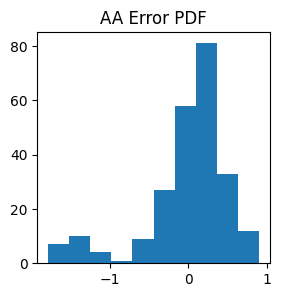

mean : -0.004471523105803801
sigma: 0.5292687770598301
sigma obs: 0.13892431356208396
sigma cnn: 0.5879201821876462
sigma new: 0.6041110043048805


In [60]:
# Models overall CNN uncertainty
forced_AAs_LE = np.array([3.7, 3.1, 3.0, 2.7, 2.5, 2.2, 2.1, 1.9])
# forced_AAs_LE = np.array([2.3, 2.3, 2.6, 2.3, 2.0, 2.0, 2.1, 2.0])

AA_error_distribution = []
for i in range(8):
    AA_error_distribution.append(mod_aa70_dist_rem[i] - forced_AAs_LE.T[i])

new_errors = []
for error in AA_error_distribution:
    squared_error = np.multiply(error, error)
    error_new = squared_error / len(squared_error)
    new_errors.append(error_new)

new_errors_all = np.concatenate(new_errors, axis=0)
new_errors_sum = np.nansum(new_errors_all, axis=0)
new_errors_mean = new_errors_sum / 8
new_errors_std = np.sqrt(new_errors_mean)

errors_concat = np.concatenate(AA_error_distribution, axis=0)

plt.figure(figsize=(3, 3))
plt.hist(errors_concat)
plt.title('AA Error PDF')
plt.show()

# Observations sample spread uncertainty
rem_AA_spread = []
for SAT in range(4):
    arctic_SAT_trend = arctic_trends[SAT]
    global_SAT_trend = global_trends[SAT]
    for model in range(8):
        global_estimate = global_obs[model, SAT]
        global_rem_num = global_SAT_trend - global_estimate
        for SLP in range(3):
            arctic_estimate = arctic_obs[model, SAT, SLP]
            arctic_rem_num = arctic_SAT_trend - arctic_estimate
            rem_AA_spread.append(arctic_rem_num / global_rem_num)

rem_AA_spread = np.reshape(rem_AA_spread, (4, 8, 3))
rem_AA_spread = np.mean(rem_AA_spread, axis=1)

sigma_obs_individual_obs = []
for i in range(4):
    sigma_obs_individual_obs.append(np.nanstd(rem_AA_spread[i]))

# Observations overall uncertainty
# sigma_obs1 = np.nanstd(np.ravel(AA_ExternalEstimates))
sigma_obs = np.nanstd(np.ravel(rem_AA_spread))

sigma_obs_individual_obs_1 = []
for sigma in sigma_obs_individual_obs:
    sigma_obs_individual_obs_1.append(np.sqrt(sigma**2 + new_errors_std**2))

new_sigma_squared = sigma_obs**2 + new_errors_std**2
new_sigma = np.sqrt(new_sigma_squared)

print('mean :', np.nanmean(errors_concat))
print('sigma:', np.std(errors_concat))
print('sigma obs:', sigma_obs)
print('sigma cnn:', new_errors_std)
print('sigma new:', new_sigma)

(25,) 3.1
(50,) 3.0
(10,) 2.7
(11,) 2.5
(25,) 2.2
(50,) 2.1
(50,) 1.9


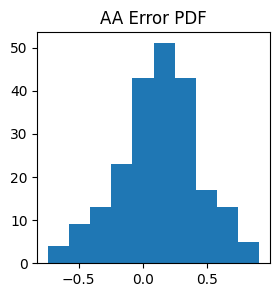

mean : 0.12932895670816769
sigma: 0.31121367704510333
sigma obs: 0.1382471597752188
sigma cnn: 0.3234086503042309
sigma new: 0.35171783047994476


In [73]:
# WITHOUT E3SMv2
# Models overall CNN uncertainty
forced_AAs_LE = np.array([3.7, 3.1, 3.0, 2.7, 2.5, 2.2, 2.1, 1.9])

AA_error_distribution_ = []
for i in range(7):
    print(np.shape(mod_aa70_dist_rem[i]), forced_AAs_LE.T[i+1])
    AA_error_distribution_.append(mod_aa70_dist_rem[i] - forced_AAs_LE.T[i+1])

new_errors_ = []
for error_ in AA_error_distribution_:
    squared_error_ = np.multiply(error_, error_)
    error_new_ = squared_error_ / len(squared_error_)
    new_errors_.append(error_new_)

new_errors_all_ = np.concatenate(new_errors_, axis=0)
new_errors_sum_ = np.nansum(new_errors_all_, axis=0)
new_errors_mean_ = new_errors_sum_ / 7
new_errors_std_ = np.sqrt(new_errors_mean_)

errors_concat_ = np.concatenate(AA_error_distribution_, axis=0)

plt.figure(figsize=(3, 3))
plt.hist(errors_concat_)
plt.title('AA Error PDF')
plt.show()

# Observations sample spread uncertainty
rem_AA_spread_ = []
for SAT in range(4):
    arctic_SAT_trend = arctic_trends[SAT]
    global_SAT_trend = global_trends[SAT]
    for model in range(7):
        global_estimate = global_obs[model+1, SAT]
        global_rem_num = global_SAT_trend - global_estimate
        for SLP in range(3):
            arctic_estimate = arctic_obs[model+1, SAT, SLP]
            arctic_rem_num = arctic_SAT_trend - arctic_estimate
            rem_AA_spread_.append(arctic_rem_num / global_rem_num)

rem_AA_spread_ = np.reshape(rem_AA_spread_, (4, 7, 3))
rem_AA_spread_ = np.mean(rem_AA_spread_, axis=1)

sigma_obs_individual_obs_ = []
for i in range(4):
    sigma_obs_individual_obs_.append(np.nanstd(rem_AA_spread_[i]))

# Observations overall uncertainty
# sigma_obs1 = np.nanstd(np.ravel(AA_ExternalEstimates))
sigma_obs_ = np.nanstd(np.ravel(rem_AA_spread_))

sigma_obs_individual_obs_1_ = []
for sigma_ in sigma_obs_individual_obs_:
    sigma_obs_individual_obs_1_.append(np.sqrt(sigma_**2 + new_errors_std_**2))

new_sigma_squared_ = sigma_obs_**2 + new_errors_std_**2
new_sigma_ = np.sqrt(new_sigma_squared_)

print('mean :', np.nanmean(errors_concat_))
print('sigma:', np.std(errors_concat_))
print('sigma obs:', sigma_obs_)
print('sigma cnn:', new_errors_std_)
print('sigma new:', new_sigma_)

In [74]:
rmse_errors = []
for errors in AA_error_distribution_:
    squared_errors = np.multiply(errors, errors)
    mean_error = np.nanmean(squared_errors)
    rmse_errors.append(np.sqrt(mean_error))
rmse_errors

[0.3227744715903421,
 0.3288948375936785,
 0.2843004385729923,
 0.29264730056362054,
 0.30520357323672187,
 0.29141352800662074,
 0.41863667375581765]

In [49]:
# Bootstrapping for MMM uncertainty
n = len(mod_arc70_dist_rem)

# Allocate bootstrapped samples arrays
arctic_sigma_bootstrap_rem, global_sigma_bootstrap_rem, aa_sigma_bootstrap_rem = [], [], []

# Bootstrap many, many times
for _ in range(500):
    # Allocate single "bootstrap" sample arrays
    arctic_samples, global_samples, aa_samples = [], [], []
    for i in range(n):
        # Get 10 random ensemble members from each model
        indices = np.random.choice(n, size=10, replace=True)
        arctic_samples.append(mod_arc70_dist_rem[i][indices])
        global_samples.append(mod_globe_dist_rem[i][indices])
        aa_samples.append(mod_arc70_dist_rem[i][indices] / mod_globe_dist_rem[i][indices])

    # Append standard deviations of each "bootstrap" of 90 samples
    arctic_sigma_bootstrap_rem.append(arctic_samples)
    global_sigma_bootstrap_rem.append(global_samples)
    aa_sigma_bootstrap_rem.append(aa_samples)

# Take average of bootstrapped sigmas
arctic_sigma_rem = np.std(arctic_sigma_bootstrap_rem)
global_sigma_rem = np.std(global_sigma_bootstrap_rem)
aa_sigma_rem = np.std(aa_sigma_bootstrap_rem)
aa_boot = np.nanmean(arctic_sigma_bootstrap_rem) / np.nanmean(global_sigma_bootstrap_rem)

arctic_sigma_rem, global_sigma_rem, aa_sigma_rem, aa_boot

(0.1893565017956011,
 0.0444736617703026,
 0.4633099032684348,
 2.6178136031671855)

In [75]:
# Without E3SMv2
# Bootstrapping for MMM uncertainty
n = len(mod_arc70_dist_rem)

# Allocate bootstrapped samples arrays
arctic_sigma_bootstrap_rem, global_sigma_bootstrap_rem, aa_sigma_bootstrap_rem = [], [], []

# Bootstrap many, many times
for _ in range(500):
    # Allocate single "bootstrap" sample arrays
    arctic_samples, global_samples, aa_samples = [], [], []
    for i in range(n):
        # Get 10 random ensemble members from each model
        indices = np.random.choice(n, size=10, replace=True)
        arctic_samples.append(mod_arc70_dist_rem[i][indices])
        global_samples.append(mod_globe_dist_rem[i][indices])
        aa_samples.append(mod_arc70_dist_rem[i][indices] / mod_globe_dist_rem[i][indices])

    # Append standard deviations of each "bootstrap" of 80 samples
    arctic_sigma_bootstrap_rem.append(arctic_samples)
    global_sigma_bootstrap_rem.append(global_samples)
    aa_sigma_bootstrap_rem.append(aa_samples)

# Take average of bootstrapped sigmas
arctic_sigma_rem_ = np.std(arctic_sigma_bootstrap_rem)
global_sigma_rem_ = np.std(global_sigma_bootstrap_rem)
aa_sigma_rem_ = np.std(aa_sigma_bootstrap_rem)
aa_boot_ = np.nanmean(arctic_sigma_bootstrap_rem) / np.nanmean(global_sigma_bootstrap_rem)

arctic_sigma_rem_, global_sigma_rem_, aa_sigma_rem_, aa_boot_

(0.1884718613598468,
 0.04442349030849478,
 0.4611494563997171,
 2.618321216860808)

In [51]:
mod_sigmas = []
for i in range(len(mod_aa70_dist_rem)):
    mod_samples = []
    for _ in range(500):
        indices = np.random.choice(n, size=10, replace=True)
        mod_samples.append(mod_aa70_dist_rem[i][indices] - forced_AAs_LE.T[i])
    mod_reshaped = np.reshape(mod_samples, (-1, 1))
    mod_squared = np.multiply(mod_reshaped, mod_reshaped)
    mod_mean = np.nanmean(mod_squared)
    mod_sigmas.append(np.sqrt(mod_mean))


print(f'{"Model":<13} {"2RMSE":>13} {"2StdDev":>11} {"Bias":>8}')
print('-' * 49)

for i in range(len(mod_sigmas)):
    mean_diff = np.nanmean(mod_aa70_dist_rem[i]) - forced_AAs_LE[i]
    print(f'{new_model_names_[i]:<14} {2*mod_sigmas[i]:>10.1f} {2*np.nanstd(mod_aa70_dist_rem[i]):>10.1f} {mean_diff:>10.1f}')

Model                 2RMSE     2StdDev     Bias
-------------------------------------------------
E3SM-2-0              0.9        0.5       -0.4
CanESM5               0.8        0.6       -0.2
MIROC6                1.1        0.5       -0.4
MPI-ESM1-2-LR         0.8        0.6       -0.2
IPSL-CM6A-LR          0.5        0.5       -0.1
ACCESS-ESM1-5         0.7        0.5        0.1
CESM2                 0.5        0.5        0.1


In [52]:
### TEST ###
# Bootstrapping for MMM uncertainty
n = len(mod_arc70_dist_rem)

# Allocate bootstrapped samples arrays
test_bs = []

# Bootstrap many, many times
for _ in range(500):
    # Allocate single "bootstrap" sample arrays
    test_samples = []
    for i in range(n):
        # Get 10 random ensemble members from each model
        indices = np.random.choice(n, size=10, replace=True)
        test_samples.append(mod_aa70_dist_rem[i][indices] - forced_AAs_LE.T[i])

    # Append standard deviations of each "bootstrap" of 80 samples
    test_bs.append(test_samples)

test_bs_reshaped = np.reshape(test_bs, (-1, 1))
test_squared = np.multiply(test_bs_reshaped, test_bs_reshaped)
test_mean = np.nanmean(test_squared)
test_sigma = np.sqrt(test_mean) 

print(f'With E3SMv2:    {test_sigma:.1f} | {np.std(test_bs):.1f} | {new_errors_std:.1f}')

# Without E3SMv2
# Bootstrapping for MMM uncertainty
n = len(mod_arc70_dist_rem[1:])

# Allocate bootstrapped samples arrays
test_bs_ = []

# Bootstrap many, many times
for _ in range(500):
    # Allocate single "bootstrap" sample arrays
    test_samples_ = []
    for i in range(n):
        # Get 10 random ensemble members from each model
        indices = np.random.choice(n, size=10, replace=True)
        test_samples_.append(mod_aa70_dist_rem[i+1][indices] - forced_AAs_LE.T[i+1])

    # Append standard deviations of each "bootstrap" of 80 samples
    test_bs_.append(test_samples_)

test_bs_reshaped_ = np.reshape(test_bs_, (-1, 1))
test_squared_ = np.multiply(test_bs_reshaped_, test_bs_reshaped_)
test_mean_ = np.nanmean(test_squared_)
test_sigma_ = np.sqrt(test_mean_) 

print(f'Without E3SMv2: {test_sigma_:.1f} | {np.std(test_bs_):.1f} | {new_errors_std_:.1f}')

NameError: name 'new_errors_std' is not defined

In [80]:
def plot_hist(mod_con, mod_dist, mod_sigma, mod_names, errors, obs_dist, obs_sigma, obs_sigma_, obs_names, num_bins, xmin, xmax, ymin, ymax, xlabel, ylabel, length, adj):

    fig, axs = plt.subplots(figsize=(4, 4), dpi=300)
    colors = cm.rainbow(np.linspace(0, 1, len(mod_dist)+1))[::-1]

    # Find normal distribution of models
    mu, std = norm.fit(mod_con)
    bins = np.linspace(xmin, xmax, num_bins)
    p = norm.pdf(bins, mu, std)
    weights = np.ones_like(mod_con) / len(mod_con)

    # Plot normal distribution
    plt.plot(bins, p / np.sum(p), color='gray', linewidth=1.5)

    # Observation linestyle list
    linestyles = ['-', '--', ':', '-.']

    # Plot observations as vertical lines
    for i in range(len(obs_dist)):
        axs.plot(np.repeat(obs_dist[i], 3), [-5, 0.3, 5], linestyle=linestyles[i], linewidth=1.5, color='k', label=f'{obs_names[i]}: {obs_dist[i]:.1f} ± {2*obs_sigma_[i]:.1f}') 

    # 2 sigma confidence
    plus_2sigma = AA_ExternalMean + 2 * new_sigma_
    minus_2sigma = AA_ExternalMean - 2 * new_sigma_
    axs.axvspan(minus_2sigma, plus_2sigma, color='grey', alpha=0.25, ec=None)

    # Add the observation mean after the last observation
    plt.plot([], [], ' ', label=f'Obs Mean: {AA_ExternalMean:.1f} ± {2*new_sigma_:.1f}\n')

    # Get forced components
    # forced_components = forced_AAs_LE
    forced_components = forced_components_CNN

    # Plot histograms for each model
    for i, model in enumerate(mod_dist):
        weights = np.ones_like(model) / len(model)
        model_std = np.nanstd(model)

        '''
        diff = forced_components[i] - np.nanmean(model)
        min_error = np.min(mod_aa70_dist_rem[i])
        max_error = np.max(mod_aa70_dist_rem[i])

        if i == 0:
            model = model + 1.3
            # min_error = min_error + 1.3
            # max_error = max_error + 1.3
        if i == 6:
            model = model - 0.2
            # min_error = min_error - 0.2
            # max_error = max_error - 0.2
        if i == 7:
            model = model - 0.2
            # min_error = min_error - 0.2
            # max_error = max_error - 0.2
        '''

        plt.hist(model,
                 bins=bins,
                 weights=weights,
                 color=colors[i+1],
                 alpha=0.3,
                 # label=f'{mod_names[i]} ({min_error:.1f}, {max_error:.1f})')
                 label=f'{mod_names[i]}: {forced_components[i]:.1f} ± {2*model_std:.1f}')  # rmse_errors[i]

    # Add the MMM after the last model
    plt.plot([], [], ' ', label=f'MMM: {aa_boot_:.1f} ± {2*aa_sigma_rem_:.1f}')  # all_ext_AA, MMM_AA70_spring

    # Plot adjustments
    plt.grid(alpha=0.3)
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    # plt.title('CNN-Derived External AA')
    axs.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), fontsize=10)

    # Plot ticks of model means
    horizontal_line_value = ymax - 0.015
    ax_position = axs.get_position()
    axs2 = plt.axes([ax_position.x0,
                     ax_position.y0,
                     ax_position.x1*0.86,
                     ax_position.y1*0.86],
                    facecolor=(1, 1, 1, 0))
    axs2.hlines(horizontal_line_value,
                xmin=np.nanmin(forced_components),
                xmax=np.nanmax(forced_components),
                colors='gray', lw=1.5)

    # Plot ticks of model means
    for i, forced_component in enumerate(forced_components):
        axs2.vlines(forced_component,
                    ymin=horizontal_line_value-length,
                    ymax=horizontal_line_value+length,
                    colors=colors[i+1],
                    alpha=0.75,
                    lw=2)

    # Don't show second axis
    axs2.spines['top'].set_visible(False)
    axs2.spines['right'].set_visible(False)
    axs2.spines['bottom'].set_visible(False)
    axs2.spines['left'].set_visible(False)
    axs2.xaxis.set_tick_params(labelbottom=False)
    axs2.yaxis.set_tick_params(labelleft=False)
    axs2.set_xticks([])
    axs2.set_yticks([])
    axs2.set_xlim(xmin, xmax)
    axs2.set_ylim(ymin, ymax)

    # plt.savefig('./figures/finalv2/Fig5_AA_Histogram_After.png', dpi=300, bbox_inches='tight')
    plt.show()

In [79]:
sigma_obs_individual_obs_, sigma_obs_individual_obs_1_

([0.08775180333507557,
  0.08212303502872358,
  0.0842648146213394,
  0.08598436107100413],
 [0.3351022740599683,
  0.3336725160601833,
  0.334206095208889,
  0.3346437888866206])

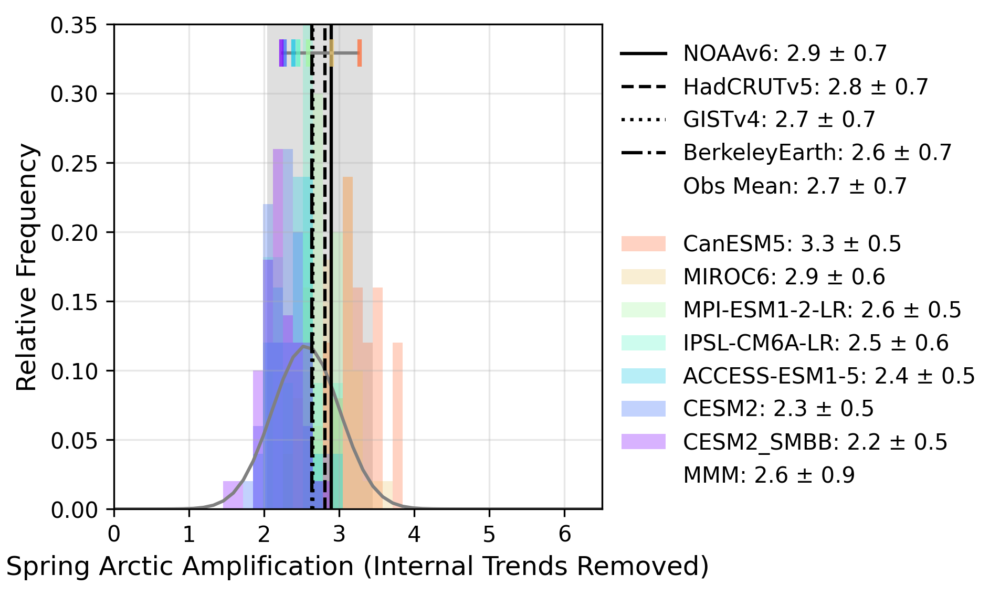

In [81]:
# Arctic Amplification
plot_hist(
    mod_con=mod_aa70_con_rem,
    mod_dist=mod_aa70_dist_rem,
    mod_sigma=aa_sigma_rem_,
    mod_names=get_model_names,
    errors=AA_error_distribution_,
    obs_dist=obs_aa70_dist_rem,
    obs_sigma=sigma_obs_individual_obs_,
    obs_sigma_=sigma_obs_individual_obs_1_,
    obs_names=obs_names,
    num_bins=50,
    xmin=0,
    xmax=6.5,
    ymin=0,
    ymax=0.35,
    xlabel="Spring Arctic Amplification (Internal Trends Removed)",
    ylabel="Relative Frequency",
    length=0.01,
    adj=0.02,
)

### Figure 6. Spring SAT (Scaled) and SLP Spatial Patterns

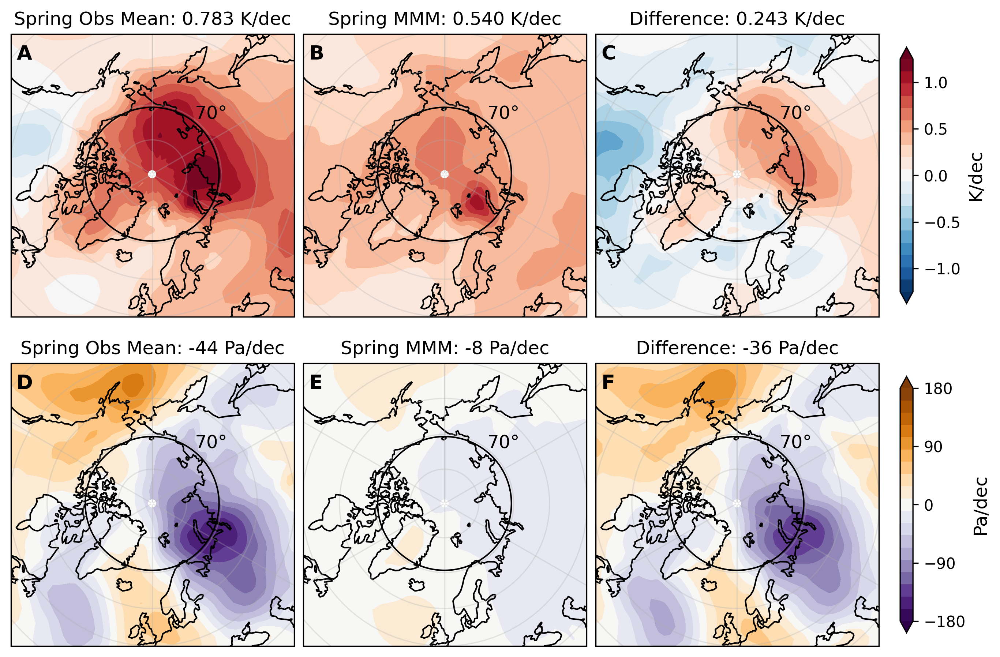

In [100]:
fig, axes = plt.subplots(2, 3, figsize=(9, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()
levels = np.linspace(-1.25, 1.25, 20)
levels_ = np.linspace(-180, 180, 20)

# Row 1: SAT
OBS_map_cyclic, lon = add_cyclic_point(OBS_mean_globe_spatial_trend, coord=lons)
im1 = axes[0].contourf(lon, lats, OBS_map_cyclic, levels=levels,
                       cmap='RdBu_r', projection=projection, transform=transform)
axes[0].set_title(f'Spring Obs Mean: {OBS_mean_arc70_spring_trend:.3f} K/dec', fontsize=12)

MMM_map_cyclic, lon = add_cyclic_point(MMM_globe_spatial_trend, coord=lons)
im2 = axes[1].contourf(lon, lats, MMM_map_cyclic, levels=levels,
                       cmap='RdBu_r', projection=projection, transform=transform)
axes[1].set_title(f'Spring MMM: {MMM_arc70_spring_trend:.3f} K/dec', fontsize=12)

DIFF_map_cyclic, lon = add_cyclic_point(DIFF_globe_spatial_trend, coord=lons)
im3 = axes[2].contourf(lon, lats, DIFF_map_cyclic, levels=levels,
                       cmap='RdBu_r', extend='both', projection=projection, transform=transform)
axes[2].set_title(f'Difference: {DIFF_arc70_spring_trend:.3f} K/dec', fontsize=12)

cbar1 = plt.colorbar(im3, ax=axes[2], location='right', shrink=0.85, pad=0.075)
cbar1.set_label('K/dec', fontsize=12)
cbar1.ax.tick_params(labelsize=10)
cbar1.ax.set_yticks(np.linspace(-1, 1, 5))

# Row 2: SLP
OBS_map_cyclic, lon = add_cyclic_point(OBS_mean_globe_spatial_trend_, coord=lons)
im4 = axes[3].contourf(lon, lats, OBS_map_cyclic, levels=levels_,
                       cmap='PuOr_r', projection=projection, transform=transform)
axes[3].set_title(f'Spring Obs Mean: {OBS_mean_arc70_spring_trend_:.0f} Pa/dec', fontsize=12)

MMM_map_cyclic, lon = add_cyclic_point(MMM_globe_spatial_trend_, coord=lons)
im5 = axes[4].contourf(lon, lats, MMM_map_cyclic, levels=levels_,
                       cmap='PuOr_r', extend='both', projection=projection, transform=transform)
axes[4].set_title(f'Spring MMM: {MMM_arc70_spring_trend_:.0f} Pa/dec', fontsize=12)

DIFF_map_cyclic, lon = add_cyclic_point(DIFF_globe_spatial_trend_, coord=lons)
im6 = axes[5].contourf(lon, lats, DIFF_map_cyclic, levels=levels_,
                       cmap='PuOr_r', extend='both', projection=projection, transform=transform)
axes[5].set_title(f'Difference: {DIFF_arc70_spring_trend_:.0f} Pa/dec', fontsize=12)

cbar2 = plt.colorbar(im6, ax=axes[5], location='right', shrink=0.85, pad=0.075)
cbar2.set_label('Pa/dec', fontsize=12)
cbar2.ax.tick_params(labelsize=10)
cbar2.ax.set_yticks(np.linspace(-180, 180, 5))

# All panels
labels = ['A', 'B', 'C', 'D', 'E', 'F']
for i, axs in enumerate(axes):
    axs.add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                  edgecolor='k', lw=1, zorder=30, transform=projection))
    axs.set_extent([0, 360, 50, 90], crs=transform)
    axs.coastlines(resolution='110m')
    axs.gridlines(alpha=0.3)
    axs.text(0.02, 0.91, labels[i], transform=axs.transAxes, fontsize=13, fontweight='bold')
    axs.text(0.65, 0.7, '70°', transform=axs.transAxes, fontsize=12)

# plt.savefig('./figures/finalv3/Fig6_Spring_Trend_Maps.png', dpi=300, bbox_inches='tight')
plt.show()

In [103]:
DIFF_globe_spatial_trend_[62, 24], lats[64], lons[24]

(-132.33359, 71.25, 61.25)

#### Monthly Spatial Patterns

In [ ]:
# ------ Monthly spatial patterns ------

# Observations
OBS_spring_months_maps_sat = np.nanmean(obs_spring_months_maps_sat, axis=0)
OBS_spring_months_maps_slp = np.nanmean(obs_spring_months_maps_slp, axis=0)

# Models: Ensemble means first
ens_means_spring_months_maps_sat, ens_means_spring_months_maps_slp = [], []
for i in range(len(mod_spring_months_maps_sat)):
    ens_means_spring_months_maps_sat.append(np.nanmean(mod_spring_months_maps_sat[i], axis=0))
    ens_means_spring_months_maps_slp.append(np.nanmean(mod_spring_months_maps_slp[i], axis=0))

# MMM
MMM_spring_months_maps_sat = np.nanmean(ens_means_spring_months_maps_sat, axis=0)
MMM_spring_months_maps_slp = np.nanmean(ens_means_spring_months_maps_slp, axis=0)

# Differences
DIFF_spring_months_maps_sat = OBS_spring_months_maps_sat - MMM_spring_months_maps_sat
DIFF_spring_months_maps_slp = OBS_spring_months_maps_slp - MMM_spring_months_maps_slp

# Check shapes
print('Maps (SAT):', np.shape(OBS_spring_months_maps_sat), np.shape(MMM_spring_months_maps_sat), np.shape(DIFF_spring_months_maps_sat))
print('Maps (SLP):', np.shape(OBS_spring_months_maps_slp), np.shape(MMM_spring_months_maps_slp), np.shape(DIFF_spring_months_maps_slp))


# ----- Monthly Arctic spatial averages ------

# Observations
obs_spring_months_trends_sat = spatial_average(np.array(obs_spring_months_maps_sat)[:, :, 64:], lats[64:])
OBS_spring_months_trends_sat = np.nanmean(obs_spring_months_trends_sat, axis=0)

obs_spring_months_trends_slp = spatial_average(np.array(obs_spring_months_maps_slp)[:, :, 64:], lats[64:])
OBS_spring_months_trends_slp = np.nanmean(obs_spring_months_trends_slp, axis=0)

# Models: Ensemble means first
ens_means_spring_months_trends_sat, ens_means_spring_months_trends_slp = [], []
for i in range(len(mod_spring_months_maps_sat)):
    ens_spatial_average_sat = spatial_average(np.array(mod_spring_months_maps_sat[i][:, :, 64:]), lats[64:])
    ens_means_spring_months_trends_sat.append(np.nanmean(ens_spatial_average_sat, axis=0))

    ens_spatial_average_slp = spatial_average(np.array(mod_spring_months_maps_slp[i][:, :, 64:]), lats[64:])
    ens_means_spring_months_trends_slp.append(np.nanmean(ens_spatial_average_slp, axis=0))

# MMM
MMM_spring_months_trends_sat = np.nanmean(ens_means_spring_months_trends_sat, axis=0)
MMM_spring_months_trends_slp = np.nanmean(ens_means_spring_months_trends_slp, axis=0)

# Differences
DIFF_spring_months_trends_sat = OBS_spring_months_trends_sat - MMM_spring_months_trends_sat
DIFF_spring_months_trends_slp = OBS_spring_months_trends_slp - MMM_spring_months_trends_slp

print('Spatial averages (SAT):', np.shape(OBS_spring_months_trends_sat), np.shape(MMM_spring_months_trends_sat), np.shape(DIFF_spring_months_trends_sat))
print('Spatial averages (SLP):', np.shape(OBS_spring_months_trends_slp), np.shape(MMM_spring_months_trends_slp), np.shape(DIFF_spring_months_trends_slp))

In [ ]:
levels = np.linspace(-1.75, 1.75, 20)
levels_ = np.linspace(-315, 315, 20)
months = ['March', 'April', 'May']

for i in range(3):
    fig, axes = plt.subplots(2, 3, figsize=(9, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
    axes = axes.ravel()

    # Row 1: SAT
    OBS_map_cyclic, lon = add_cyclic_point(OBS_spring_months_maps_sat[i], coord=lons)
    im1 = axes[0].contourf(lon, lats, OBS_map_cyclic, levels=levels,
                           cmap='RdBu_r', projection=projection, transform=transform)
    axes[0].set_title(f'Obs Mean: {OBS_spring_months_trends_sat[i]:.3f} K/dec', fontsize=12)

    MMM_map_cyclic, lon = add_cyclic_point(MMM_spring_months_maps_sat[i], coord=lons)
    im2 = axes[1].contourf(lon, lats, MMM_map_cyclic, levels=levels,
                           cmap='RdBu_r', projection=projection, transform=transform)
    axes[1].set_title(f'CMIP6 MMM: {MMM_spring_months_trends_sat[i]:.3f} K/dec', fontsize=12)

    DIFF_map_cyclic, lon = add_cyclic_point(DIFF_spring_months_maps_sat[i], coord=lons)
    im3 = axes[2].contourf(lon, lats, DIFF_map_cyclic, levels=levels,
                           cmap='RdBu_r', extend='both', projection=projection, transform=transform)
    axes[2].set_title(f'Difference: {DIFF_spring_months_trends_sat[i]:.3f} K/dec', fontsize=12)

    cbar1 = plt.colorbar(im3, ax=axes[2], location='right', shrink=0.85, pad=0.075)
    cbar1.set_label('K/dec', fontsize=12)
    cbar1.ax.tick_params(labelsize=10)
    cbar1.ax.set_yticks(np.linspace(-1.5, 1.5, 7))

    # Row 2: SLP
    OBS_map_cyclic, lon = add_cyclic_point(OBS_spring_months_maps_slp[i], coord=lons)
    im4 = axes[3].contourf(lon, lats, OBS_map_cyclic, levels=levels_,
                           cmap='PuOr_r', projection=projection, transform=transform)
    axes[3].set_title(f'Obs Mean: {OBS_spring_months_trends_slp[i]:.0f} Pa/dec', fontsize=12)

    MMM_map_cyclic, lon = add_cyclic_point(MMM_spring_months_maps_slp[i], coord=lons)
    im5 = axes[4].contourf(lon, lats, MMM_map_cyclic, levels=levels_,
                           cmap='PuOr_r', extend='both', projection=projection, transform=transform)
    axes[4].set_title(f'CMIP6 MMM: {MMM_spring_months_trends_slp[i]:.0f} Pa/dec', fontsize=12)

    DIFF_map_cyclic, lon = add_cyclic_point(DIFF_spring_months_maps_slp[i], coord=lons)
    im6 = axes[5].contourf(lon, lats, DIFF_map_cyclic, levels=levels_,
                           cmap='PuOr_r', extend='both', projection=projection, transform=transform)
    axes[5].set_title(f'Difference: {DIFF_spring_months_trends_slp[i]:.0f} Pa/dec', fontsize=12)

    cbar2 = plt.colorbar(im6, ax=axes[5], location='right', shrink=0.85, pad=0.075)
    cbar2.set_label('Pa/dec', fontsize=12)
    cbar2.ax.tick_params(labelsize=10)
    cbar2.ax.set_yticks(np.linspace(-300, 300, 7))

    plt.suptitle(months[i], x=0.45, y=1.025, fontsize=14)

    # All panels
    labels = ['A', 'B', 'C', 'D', 'E', 'F']
    for i, axs in enumerate(axes):
        axs.add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                      edgecolor='k', lw=1, zorder=30, transform=projection))
        axs.set_extent([0, 360, 50, 90], crs=transform)
        axs.coastlines(resolution='110m')
        axs.gridlines(alpha=0.3)
        axs.text(0.02, 0.91, labels[i], transform=axs.transAxes, fontsize=13, fontweight='bold')
        axs.text(0.65, 0.7, '70°', transform=axs.transAxes, fontsize=12)

    # plt.savefig('./figures/finalv3/Fig6_Spring_Trend_Maps.png', dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(9, 6), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
axes = axes.ravel()
levels_ = np.linspace(-180, 180, 20)

# Define the region for Northern Siberia
lon_min, lon_max = 35, 90
lat_min, lat_max = 63, 77

# Generate more points along the edges for smoothness
lons_ = np.linspace(lon_min, lon_max, 100)
lats_bottom = np.full_like(lons_, lat_min)
lats_top = np.full_like(lons_, lat_max)

lats_ = np.linspace(lat_min, lat_max, 100)
lons_left = np.full_like(lats_, lon_min)
lons_right = np.full_like(lats_, lon_max)

# Concatenate edges
lons_smooth = np.concatenate([lons_, [lon_max] * 100, lons_[::-1], [lon_min] * 100])
lats_smooth = np.concatenate([lats_bottom, lats_, lats_top[::-1], lats_[::-1]])

# Row 2: SLP
OBS_map_cyclic, lon = add_cyclic_point(OBS_mean_globe_spatial_trend_, coord=lons)
im4 = axes[0].contourf(lon, lats, OBS_map_cyclic, levels=levels_,
                       cmap='PuOr_r', projection=projection, transform=transform)
axes[0].set_title(f'Obs Mean: {OBS_mean_arc70_spring_trend_:.0f} Pa/dec', fontsize=12)

MMM_map_cyclic, lon = add_cyclic_point(MMM_globe_spatial_trend_, coord=lons)
im5 = axes[1].contourf(lon, lats, MMM_map_cyclic, levels=levels_,
                       cmap='PuOr_r', extend='both', projection=projection, transform=transform)
axes[1].set_title(f'CMIP6 MMM: {MMM_arc70_spring_trend_:.0f} Pa/dec', fontsize=12)

DIFF_map_cyclic, lon = add_cyclic_point(DIFF_globe_spatial_trend_, coord=lons)
im6 = axes[2].contourf(lon, lats, DIFF_map_cyclic, levels=levels_,
                       cmap='PuOr_r', extend='both', projection=projection, transform=transform)
axes[2].set_title(f'Difference: {DIFF_arc70_spring_trend_:.0f} Pa/dec', fontsize=12)

cbar2 = plt.colorbar(im6, ax=axes[2], location='right', shrink=0.4, aspect=15, pad=0.075)
cbar2.set_label('Pa/dec', fontsize=12)
cbar2.ax.tick_params(labelsize=10)
cbar2.ax.set_yticks(np.linspace(-180, 180, 5))

# All panels
labels = ['D', 'E', 'F']
for i, axs in enumerate(axes):
    axs.add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                  edgecolor='k', lw=1, zorder=30, transform=projection))
    axs.set_extent([0, 360, 50, 90], crs=transform)
    axs.coastlines(resolution='110m')
    axs.gridlines(alpha=0.3)
    axs.text(0.02, 0.91, labels[i], transform=axs.transAxes, fontsize=13, fontweight='bold')
    axs.text(0.65, 0.7, '70°', transform=axs.transAxes, fontsize=12)
    axs.plot(lons_smooth, lats_smooth, transform=ccrs.PlateCarree(), color='red', linewidth=2)

plt.show()

In [ ]:
# Load observation timeseries data
slp_paths = glob.glob('/glade/work/skygale/observations/slp-regrid-global-1950/ERA5.nc')

slp_ts_all = []
for path in slp_paths:
    obs_name = path.split('/')[6][:-3]
    ds = xr.open_dataset(path).DATA * 0.01

    # Get yearly spring-means
    ds_spring = np.nanmean(np.array(ds)[:, 2:5], axis=1)

    # Append
    slp_ts = ds_spring

print(slp_ts.shape)

# Load model timeseries data
spliced_paths = glob.glob('/glade/work/skygale/cmip6/monthly-processed/spliced/*')

slp_models = []
for path in spliced_paths:
    model_name = path.split('/')[7][:-3]
    ds = xr.open_dataset(path)

    ds_spring = ds.SAT_SLP.sel(year=slice(1950, 2022)).sel(month=slice(3, 5)).mean('member').mean('month')

    # Append SAT and SLP data to respective arrays
    if model_name in ['CESM2', 'CESM2_SMBB']:
        slp_models.append(ds_spring[:, :, :, 0] * 0.01)
    else:
        slp_models.append(ds_spring[:, :, :, 1] * 0.01)

# Take MME
slp_mme = np.nanmean(slp_models, axis=0)
print(slp_mme.shape)

In [ ]:
# Define space arrays
lats = np.arange(-88.75, 88.751, 2.5)
lons = np.arange(1.25, 358.751, 2.5)

# Define time arrays
decades = np.arange(1950, 2023, 1)/10
years = decades * 10

In [ ]:
# Get spatial averages box of SAT timeseries
slp_obs_ts_box = spatial_average(slp_ts[:, 64:77], lats[64:77])
slp_mme_ts_box = spatial_average(slp_mme[:, 64:77], lats[64:77])

# Compute correlation
corr_coef, p_value = stats.pearsonr(slp_obs_ts_box, slp_mme_ts_box)

# Observational sets timeseries plot for comparison
plt.figure(figsize=(8, 3), dpi=300)

regr = stats.linregress(decades, slp_obs_ts_box)
trend_line = regr[1] + decades * regr[0]
plt.plot(years, slp_obs_ts_box, label=f'Observations {regr[0]:.3f} mb/dec', color='k')
plt.plot(years, trend_line, color='k', linestyle='--', alpha=0.3)

regr = stats.linregress(decades, slp_mme_ts_box)
trend_line = regr[1] + decades * regr[0]
plt.plot(years, slp_mme_ts_box, label=f'MMM {regr[0]:.3f} mb/dec', color='r')
plt.plot(years, trend_line, color='r', linestyle='--', alpha=0.3)

plt.grid(alpha=0.3)
plt.xlim(1950, 2022)
plt.legend(frameon=False)
plt.xlabel('Year')
plt.ylabel('Sea Level Pressure (mb)')
plt.title(f'Barents-Kara Sea/Northern Siberia SLP, r = {corr_coef:.2f}', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
import imageio

# Define the region for Northern Siberia
lon_min, lon_max = 35, 90
lat_min, lat_max = 63, 77

# Generate more points along the edges for smoothness
lons_ = np.linspace(lon_min, lon_max, 100)
lats_bottom = np.full_like(lons_, lat_min)
lats_top = np.full_like(lons_, lat_max)

lats_ = np.linspace(lat_min, lat_max, 100)
lons_left = np.full_like(lats_, lon_min)
lons_right = np.full_like(lats_, lon_max)

# Concatenate edges
lons_smooth = np.concatenate([lons_, [lon_max] * 100, lons_[::-1], [lon_min] * 100])
lats_smooth = np.concatenate([lats_bottom, lats_, lats_top[::-1], lats_[::-1]])

levels = np.linspace(np.min(slp_ts), np.max(slp_ts), 20)
labels = np.linspace(1950, 2022, 73)

frames = []
for i in range(73):
    fig, axes = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True, subplot_kw={'projection':projection}, dpi=300)
    axes = axes.ravel()

    OBS_map_cyclic, lon = add_cyclic_point(slp_ts[i], coord=lons)
    im4 = axes[0].contourf(lon, lats, OBS_map_cyclic, levels=levels, cmap='PuOr_r', projection=projection, transform=transform)

    MMM_map_cyclic, lon = add_cyclic_point(slp_mme[i], coord=lons)
    im5 = axes[1].contourf(lon, lats, MMM_map_cyclic, levels=levels, cmap='PuOr_r', extend='both', projection=projection, transform=transform)

    cbar2 = plt.colorbar(im5, ax=axes[1], location='right', shrink=0.85, pad=0.075)
    cbar2.set_label('mb', fontsize=12)
    cbar2.ax.tick_params(labelsize=10)

    for a, axs in enumerate(axes):
        axs.add_patch(mpatches.Circle(xy=[lon_draw, lat_draw], radius=r_ortho70, facecolor='None',
                                      edgecolor='k', lw=1, zorder=30, transform=projection))
        axs.set_extent([0, 360, 50, 90], crs=transform)
        axs.coastlines(resolution='110m')
        axs.gridlines(alpha=0.3)
        axs.plot(lons_smooth, lats_smooth, transform=ccrs.PlateCarree(), color='red', linewidth=2)
        axs.set_title(f'{labels[i]:.0f}', fontsize=12)

    # Save frame as image
    frame_filename = f'frame_{i}.png'
    plt.savefig(frame_filename, dpi=300)
    frames.append(frame_filename)
    plt.close()

# Create GIF
gif_filename = "slp_northern_siberia.gif"
imageio.mimsave(gif_filename, [imageio.imread(frame) for frame in frames], duration=1)

print(f"GIF saved as {gif_filename}")

In [ ]:
plt.figure(figsize=(6, 8), dpi=300)
for i in range(len(mod_globe_spatial_trends)):
    for j in range(len(mod_globe_spatial_trends[i])):
        plt.plot(np.nanmean(mod_globe_spatial_trends[i][j], axis=1), lats, color='lightpink', alpha=0.1)

plt.plot(np.nanmean(MMM_globe_spatial_trend, axis=1), lats, color='r', label='CMIP6 MMM')
plt.plot(np.nanmean(OBS_mean_globe_spatial_trend, axis=1), lats, color='k', label='Observations')

plt.ylim(-90, 90)
plt.grid(alpha=0.3)
plt.legend(loc='center right', frameon=False)
plt.ylabel('Latitude')
plt.xlabel('Zonal Mean SAT Warming (K/dec)')
plt.title('Spring SAT Warming Trend')
plt.text(-0.45, 92, 'A', fontsize=14, fontweight='bold')
plt.show()

In [ ]:
plt.figure(figsize=(6, 8), dpi=300)
for i in range(len(mod_globe_spatial_trends)):
    for j in range(len(mod_globe_spatial_trends[i])):
        plt.plot(np.nanmean(mod_globe_spatial_trends[i][j]/MMM_globe_spring_trend, axis=1), lats, color='lightpink', alpha=0.1)

plt.plot(np.nanmean(MMM_globe_spatial_trend/MMM_globe_spring_trend, axis=1), lats, color='r', label='CMIP6 MMM')
plt.plot(np.nanmean(OBS_mean_globe_spatial_trend/OBS_mean_globe_spring_trend, axis=1), lats, color='k', label='Observations')

plt.ylim(-90, 90)
plt.grid(alpha=0.3)
plt.legend(loc='center right', frameon=False)
plt.ylabel('Latitude')
plt.xlabel('Zonal Mean Amplification')
plt.title('Spring Amplification')
plt.text(-0.45, 92, 'B', fontsize=14, fontweight='bold')
plt.show()

To find out how much of the Arctic warming trend in a particular calendar month is explained by the SLP trend for that month, you need to take the inner product of the trend pattern and the regression pattern: i.e., to multiply them, grid point by grid point and sum over all grid points (weight by cosine). I suggest that you do that for all calendar months so that you can see whether April stands out.

In [ ]:
# Load SAT data
SAT_paths = glob.glob('/glade/work/skygale/observations/sat-regrid-global/*')

SAT_arrays = []
for path in np.sort(SAT_paths):
    ds = xr.open_dataset(path, engine="netcdf4")
    SAT_arrays.append(ds)

# Load SLP data
SLP_paths = glob.glob('/glade/work/skygale/observations/slp-regrid-global/*')

SLP_arrays = []
for path in SLP_paths:
    ds = xr.open_dataset(path, engine="netcdf4")
    SLP_arrays.append(ds)

# Combine all datasets
SAT_xarray = xr.concat(SAT_arrays, dim="dataset")
SLP_xarray = xr.concat(SLP_arrays, dim="dataset")

# Convert xarrays to numpy arrays
SAT_np = SAT_xarray.to_array().values[0]
SLP_np = SLP_xarray.to_array().values[0]

# Output dimensions
print(f"SAT_np: {SAT_np.shape}")
print(f"SLP_np: {SLP_np.shape}")

# Get anomalies
SAT_anoms = SAT_np - np.nanmean(SAT_np, axis=1)[:, np.newaxis]
SLP_anoms = SLP_np - np.nanmean(SLP_np, axis=1)[:, np.newaxis]

# Get field maps north of 20N and cosine weights
SAT_anoms_20N = SAT_anoms[:, :, :, 44:]
SLP_anoms_20N = SLP_anoms[:, :, :,  44:]
weights = np.cos(np.deg2rad(lats[44:]))[::-1]

# Get Arctic (70N) SAT timeseries
SAT_arctic_ts = spatial_average(SAT_np[:, :, :, 64:], lats[64:])
SAT_arctic_anoms_ts = SAT_arctic_ts - np.nanmean(SAT_arctic_ts, axis=1)[:, np.newaxis]
SAT_ts_std = SAT_arctic_anoms_ts / np.std(SAT_arctic_anoms_ts)

# Output dimensions
print(f"\nSAT_anoms_20N: {SAT_anoms_20N.shape}")
print(f"SLP_anoms_20N: {SLP_anoms_20N.shape}")
print(f"SAT_ts_std:    {SAT_arctic_ts.shape}")

In [ ]:
def reg_finder(X, z):
    regr_map, recr_map = [], []
    for lat in range(np.shape(X)[1]):
        regr_by_lat, recr_by_lat = [], []
        for lon in range(np.shape(X)[2]):
            X_ts = X[:, lat, lon]
            try:
                regr = stats.linregress(z, X_ts)
                z_regressed_out = X_ts - (regr[1] + regr[0] * z)
                regr_by_lat.append(regr[0])
                recr_by_lat.append(z_regressed_out)
            except:
                regr_by_lat.append(np.nan)
                recr_by_lat.append(np.repeat(np.nan, len(z)))
        regr_map.append(regr_by_lat)
        recr_map.append(recr_by_lat)
    return np.array(regr_map).T, np.array(recr_map).T

In [ ]:
SLP_SAT_regr_maps = []
for month in range(12):
    monthly_regr = []
    for sat_idx in range(np.shape(SAT_anoms_20N)[0]):
        for slp_idx in range(np.shape(SLP_anoms_20N)[0]):
            SLP_SAT_regr_map, _ = reg_finder(SLP_anoms_20N[slp_idx, :, month], SAT_ts_std[sat_idx, :, month])
            monthly_regr.append(SLP_SAT_regr_map)
    SLP_SAT_regr_maps.append(monthly_regr)

SLP_SAT_regr_maps_swap = np.swapaxes(SLP_SAT_regr_maps, 2, 3)
np.shape(SLP_SAT_regr_maps_swap)

In [ ]:
obs_slp_std = obs_slp / np.nanstd(obs_slp, axis=(2, 3), keepdims=True)
np.shape(obs_sat), np.shape(obs_slp), np.shape(obs_slp_std)

In [ ]:
inner_products = []
for month in range(12):
    monthly_inner_products = []
    for combo in range(12):
        regr_map = SLP_SAT_regr_maps_swap[combo][month]
        for slp_idx in range(3):
            slp_map = obs_slp_std[slp_idx][month]
            inner_product = np.multiply(slp_map[44:], regr_map)
            monthly_inner_products.append(inner_product)
    inner_products.append(monthly_inner_products)
print(np.shape(inner_products))

In [ ]:
mean_inner_products = np.nanmean(inner_products, axis=1)

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for i in range(12):
    sum_inner_products = np.nansum(mean_inner_products[i] * np.cos(np.deg2rad(lats[44:]))[:, np.newaxis])
    print(f"{months[i]}: {sum_inner_products:.0f}")